# Introduction
This notebook facilitates the manual curation of sample alignment.

In [1]:
import deltascope.alignment as ut

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import h5py

import os
import re
import time
import tqdm

# Setup

## Parameters

In [2]:
# --------------------------------
# -------- User input ------------
# --------------------------------

param = {
    'gthresh':0.5,
    'scale':[1,1,1],
    'microns':[0.16,0.16,0.21],
    'mthresh':0.5,
    'radius':20,
    'comp_order':[0,2,1],
    'fit_dim':['x','z'],
    'deg':2,
    
    # Don't forget to modify this with a specific sample name
    'expname':'wt'
}

## Directories

In [3]:
# --------------------------------
# -------- User input ------------
# --------------------------------

# Specify file paths to directories containing probability files
# after processing by ilastik
gfap = '.\data\ZRF1 Wild Type HZ H5 files\Prob_7-29'
at = '.\data\AT Wild Type HZ H5 files\Prob'

# Specify root directory where output will be saved
root = '.\data'

root

'.\\data'

In [4]:
# Output directory with timestamp
outname = 'Output_'+param['expname']+time.strftime("%m-%d-%H-%M",
                                 time.localtime())

# Create output directory
outdir = os.path.join(root,outname)
os.mkdir(outdir)

## Extract list of files

In [12]:
Dat = {}
for f in os.listdir(at):
    if 'h5' in f:
        num  = re.findall(r'\d+',f.split('.')[0])[-1]
        Dat[num] = os.path.join(at,f)

In [13]:
Dzrf = {}
for f in os.listdir(gfap):
    if 'h5' in f:
        num  = re.findall(r'\d+',f.split('.')[0])[-1]
        Dzrf[num] = os.path.join(gfap,f)

In [14]:
# Create dictionaries to contain the deltascope brain object for each sample
Dbat = {}
Dbzrf = {}

In [15]:
klist = Dzrf.keys()
klist

dict_keys(['101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143'])

# PCA: Import raw data and perform preprocessing

In [16]:
%%time
for k in tqdm.tqdm(klist):
    if k not in list(Dbat.keys()):
        try:
            Dbat[k] = ut.preprocess(Dat[k],param)
            Dbzrf[k] = ut.preprocess(Dzrf[k],param,pca=Dbat[k].pcamed,
                                 mm=Dbat[k].mm,vertex=Dbat[k].vertex)
        except:
            print(k,'caused an error')
    else:
        print(k,'already processed')

  0%|          | 0/43 [00:00<?, ?it/s]C:\Users\zfishlab\AppData\Local\Continuum\anaconda3\envs\test\lib\site-packages\skimage\util\dtype.py:141: UserWarning: Possible precision loss when converting from float32 to uint8
  .format(dtypeobj_in, dtypeobj_out))
  2%|▏         | 1/43 [01:37<1:08:05, 97.28s/it]C:\Users\zfishlab\AppData\Local\Continuum\anaconda3\envs\test\lib\site-packages\skimage\util\dtype.py:141: UserWarning: Possible precision loss when converting from float32 to uint8
  .format(dtypeobj_in, dtypeobj_out))
  5%|▍         | 2/43 [03:10<1:05:43, 96.18s/it]C:\Users\zfishlab\AppData\Local\Continuum\anaconda3\envs\test\lib\site-packages\skimage\util\dtype.py:141: UserWarning: Possible precision loss when converting from float32 to uint8
  .format(dtypeobj_in, dtypeobj_out))
  7%|▋         | 3/43 [04:53<1:05:21, 98.03s/it]C:\Users\zfishlab\AppData\Local\Continuum\anaconda3\envs\test\lib\site-packages\skimage\util\dtype.py:141: UserWarning: Possible precision loss when convertin

Wall time: 1h 5min 27s


# Define experiment specific functions

In [17]:
''' Define wrapper functions for starting and saving to minimize the number 
of inputs that the user needs to type for each call of the function.'''
def start(k):
    return(ut.start(k,Dbat,[Dbzrf],im=True))
def save_both(k,dfa,dfb):
    ut.save_both(k,dfa,dfb,outdir,param['expname'])

'''Save model parameters for each file to a dataframe that can be 
exported for later reference.'''
model = pd.DataFrame({'a':[],'b':[],'c':[]})
def save_model(k,mm,model):
    row = pd.Series({'a':mm[0],'b':mm[1],'c':mm[2]},name=k)
    model = model.append(row)
    return(model)

'''Define a function that can both fit a model and plot it on an existing plot'''
def fit_model(axi,df,mm=None):
    if mm == None:
        mm = np.polyfit(df.x,df.z,2)
    p = np.poly1d(mm)
    xrange = np.arange(np.min(df.x),np.max(df.x))
    axi.plot(xrange,p(xrange),c='m')
    return(mm)

'''Take a set of points and transform to a dataframe format for ease of access.'''
def pick_pts(x1,z1,vx,vz,x2,z2):
    pts = pd.DataFrame({'x':[x1,vx,x2],'z':[z1,vz,z2]})
    return(pts)

# Align Samples

In [18]:
klist

dict_keys(['101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143'])

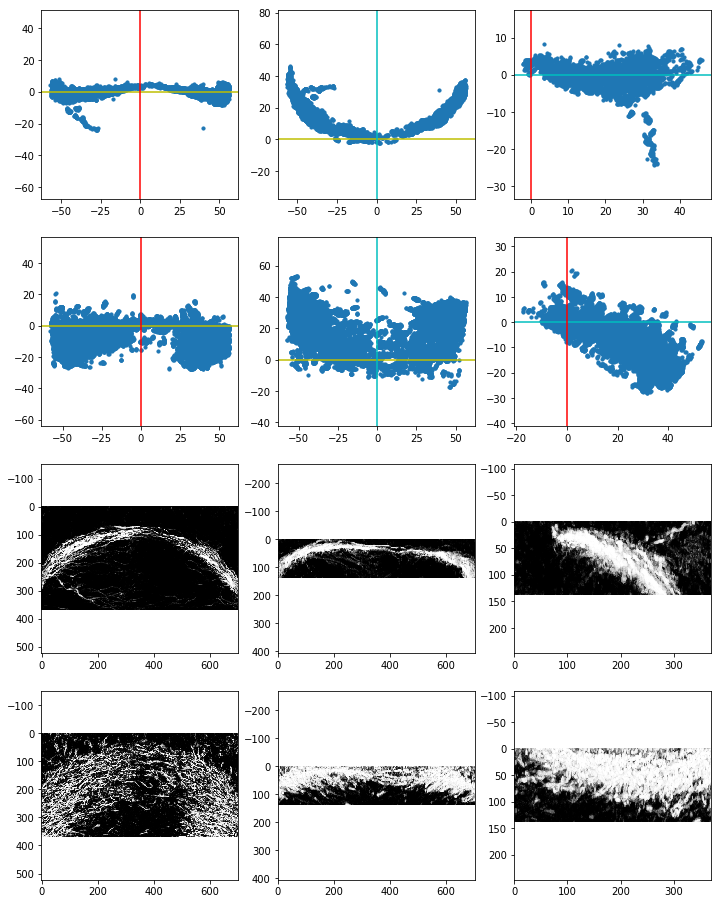

In [19]:
k,df,Ldf,ax = start('101')

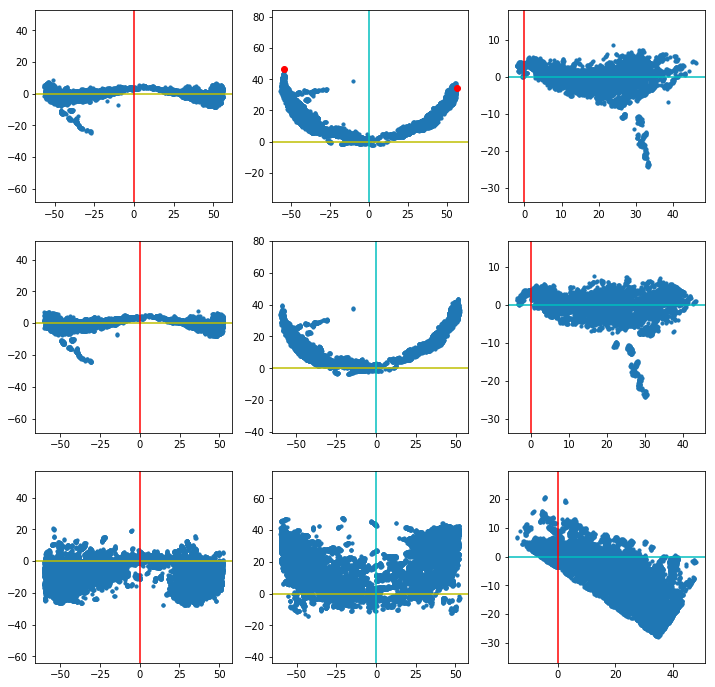

In [20]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

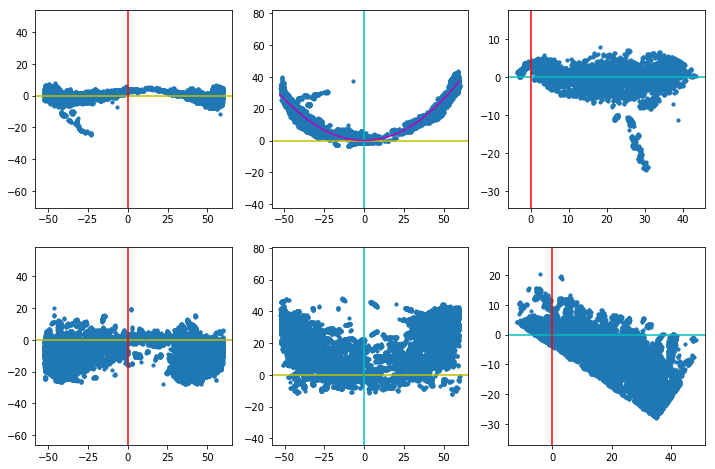

In [21]:
df2,Ldf2,mm,ax = ut.ch_vertex(df1,Ldf1)

In [22]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_101_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_101_wt.psi complete


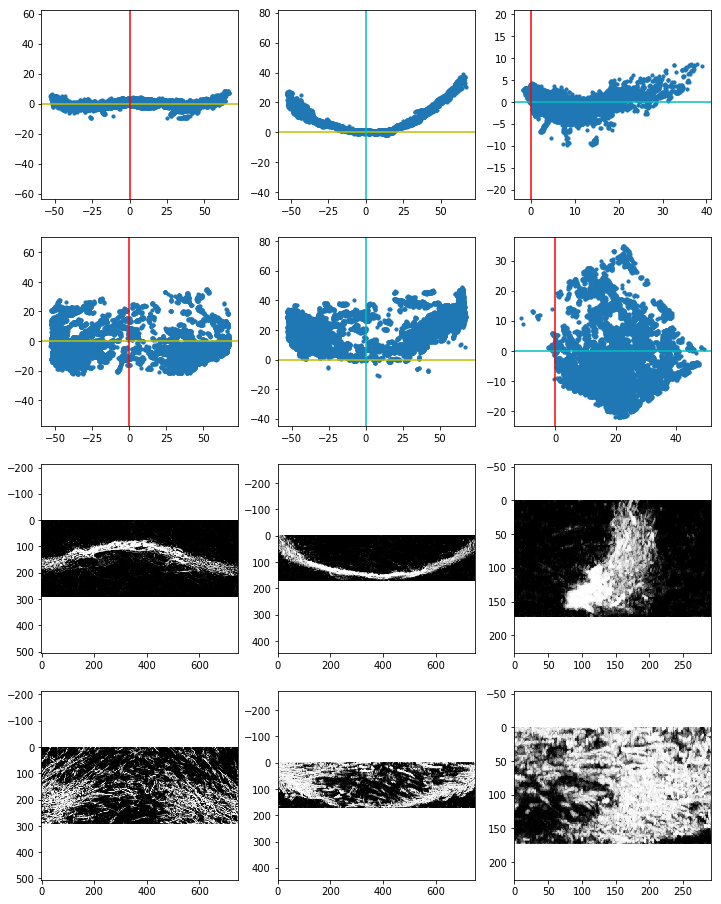

In [23]:
k,df,Ldf,ax = start('102')

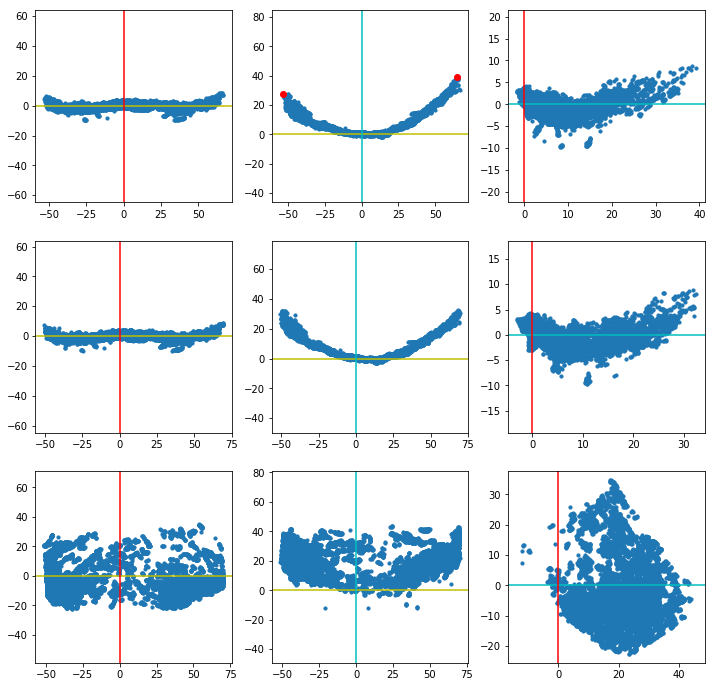

In [24]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

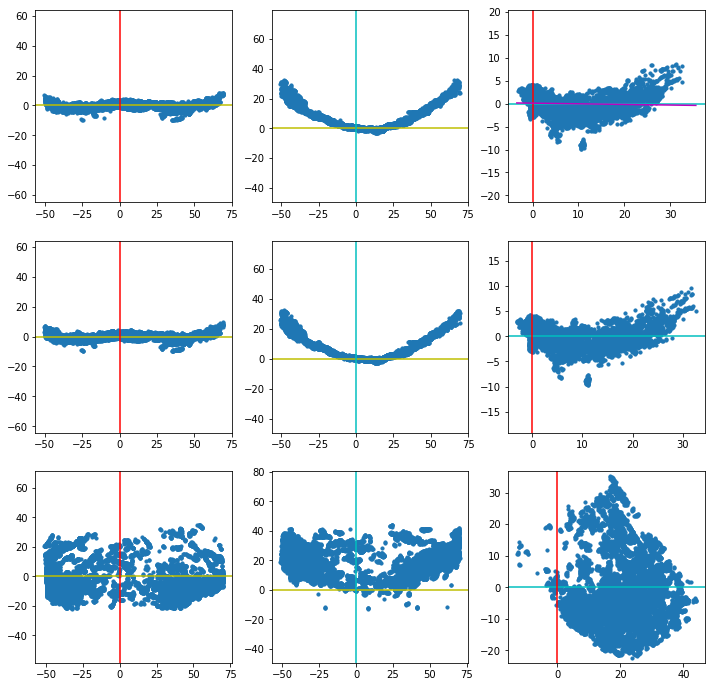

In [25]:
df2,Ldf2,ax,p = ut.check_yz(df1,Ldf1)

In [26]:
p

poly1d([-0.01371249,  0.09442082])

\[a,b] $y=ax+b$

In [27]:
p

poly1d([-0.01371249,  0.09442082])

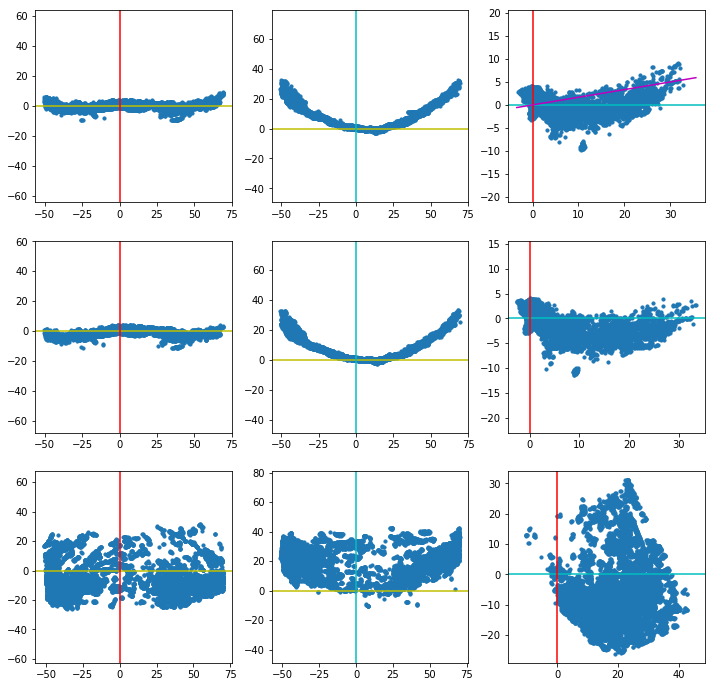

In [29]:
p1 = [5/30,0]
df3,Ldf3,ax,p = ut.check_yz(df1,Ldf1,mm=p1)

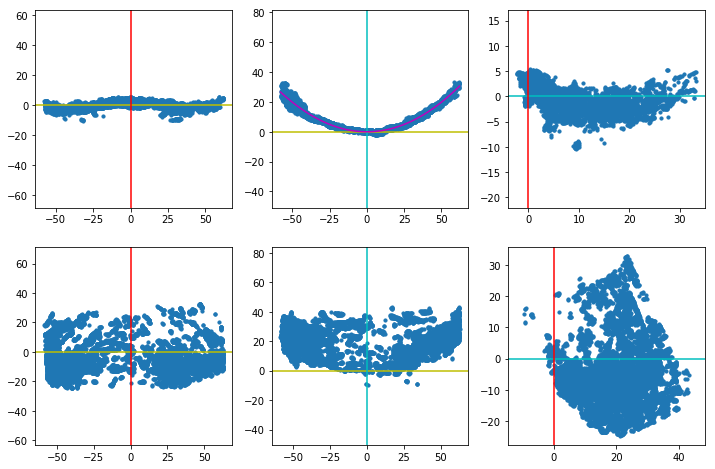

In [30]:
df4,Ldf4,mm,ax = ut.ch_vertex(df3,Ldf3)

In [31]:
model = save_model(k,mm,model)
save_both(k,df4,Ldf4[0])

Write to .\data\Output_wt03-09-21-29\AT_102_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_102_wt.psi complete


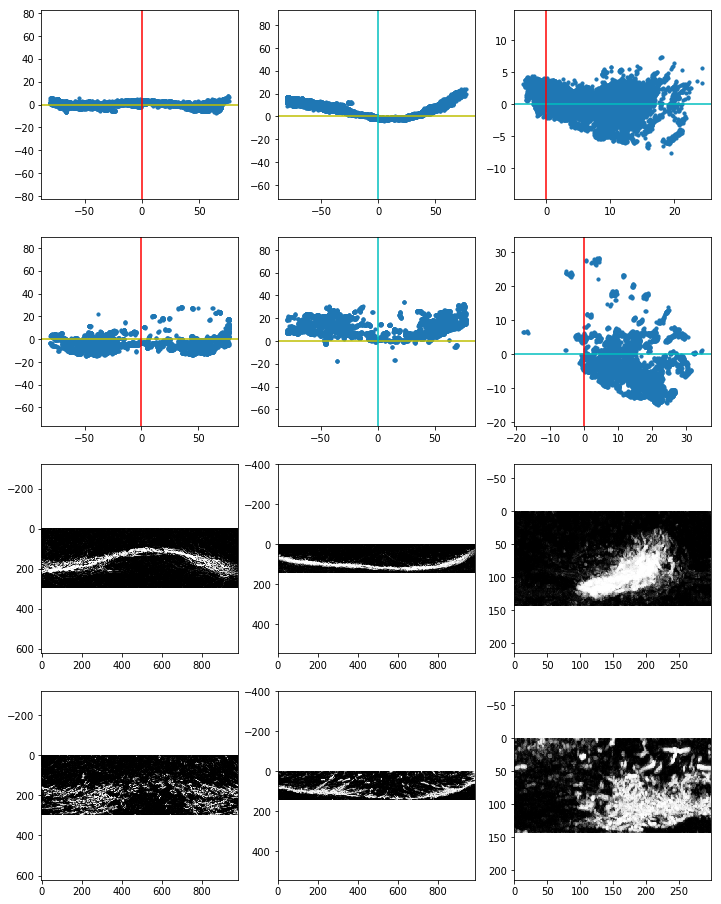

In [32]:
k,df,Ldf,ax = start('103')

Sample 103 appears warped in both xy and yz projections and will be discarded from processing

In [33]:
klist

dict_keys(['101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143'])

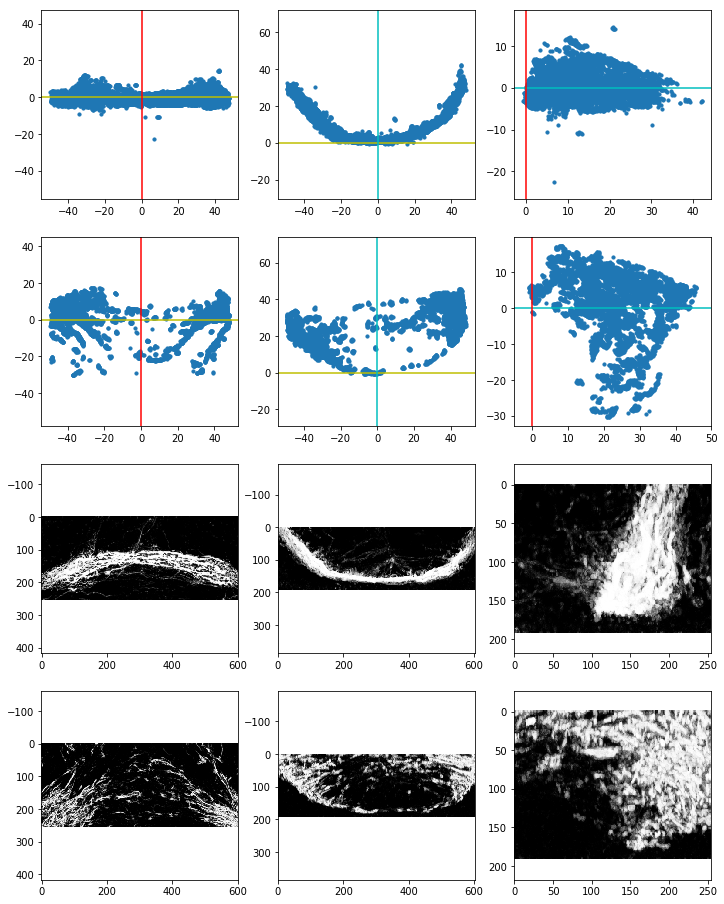

In [34]:
k,df,Ldf,ax = start('104')

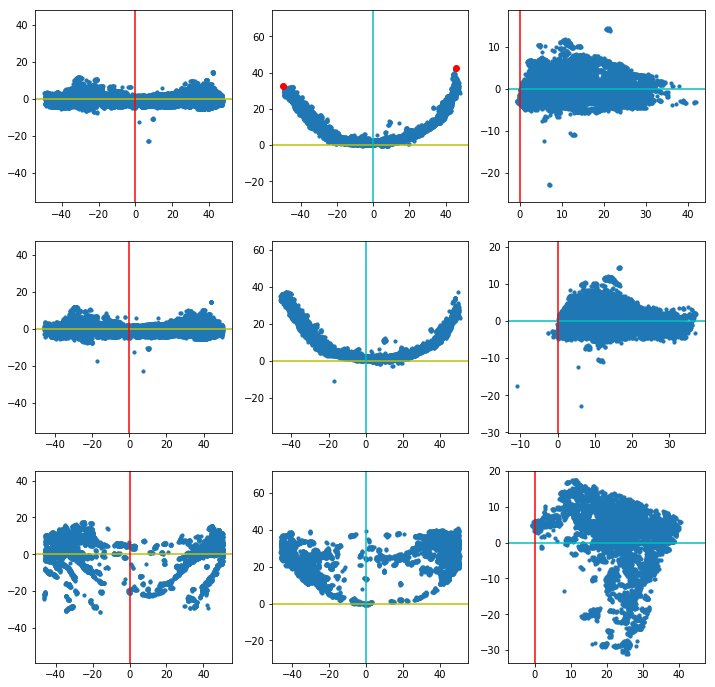

In [35]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

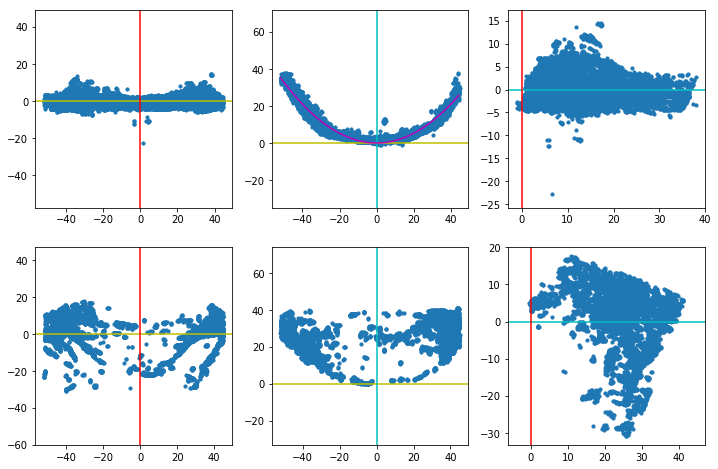

In [36]:
df2,Ldf2,mm,ax = ut.ch_vertex(df1,Ldf1)

In [37]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_104_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_104_wt.psi complete


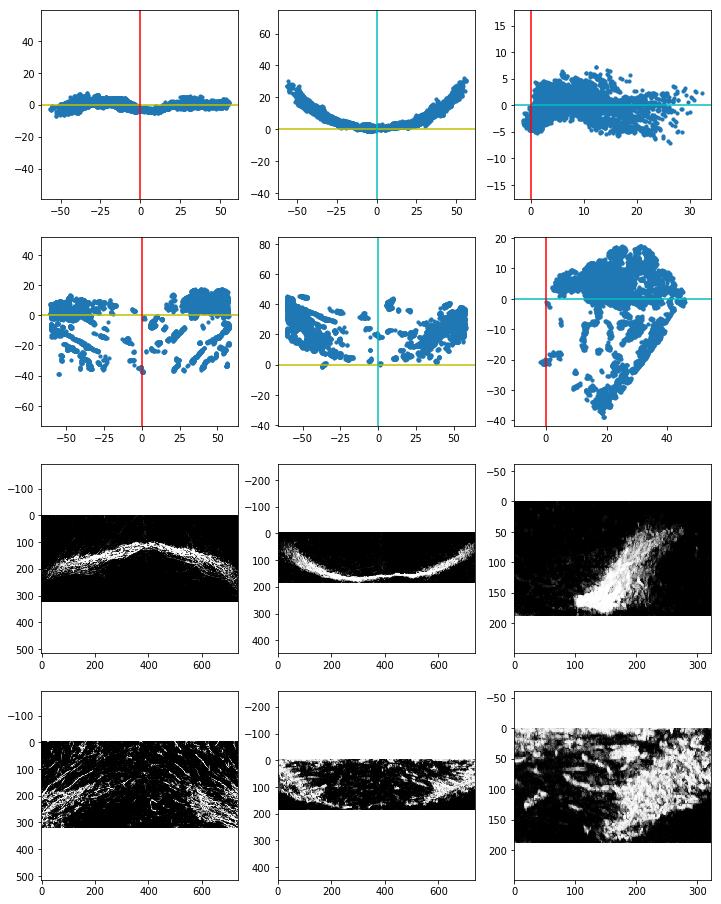

In [38]:
k,df,Ldf,ax = start('105')

In [39]:
p

poly1d([0.16666667, 0.        ])

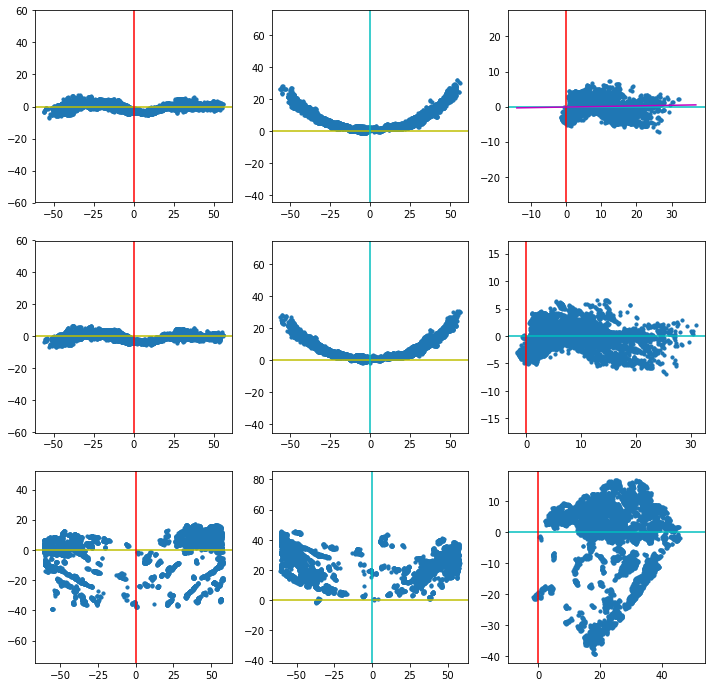

In [40]:
df1,Ldf1,ax,p = ut.check_yz(df,Ldf)

In [41]:
p

poly1d([ 0.01671887, -0.12012197])

In [42]:
p1=[.0167,-3.0]

In [43]:
p1

[0.0167, -3.0]

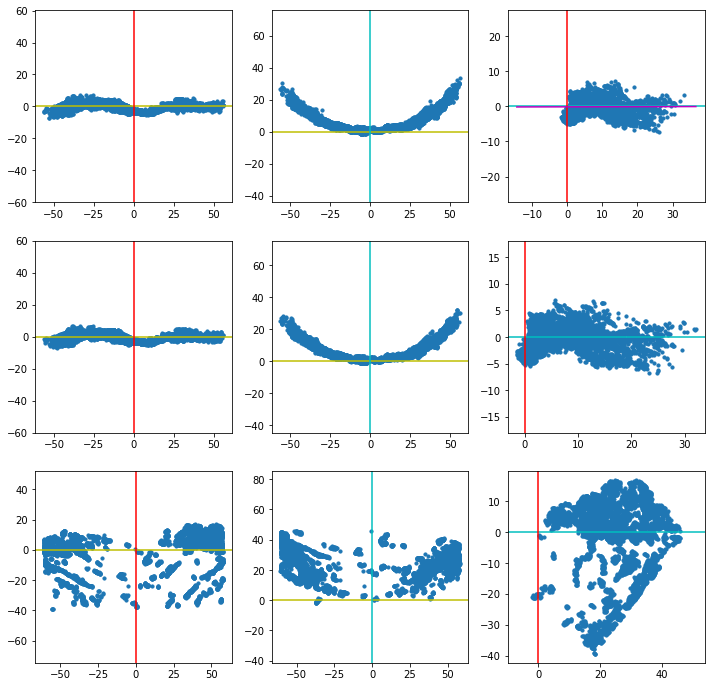

In [44]:
df2,Ldf2,ax,p1 = ut.check_yz(df1,Ldf1)

In [45]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_105_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_105_wt.psi complete


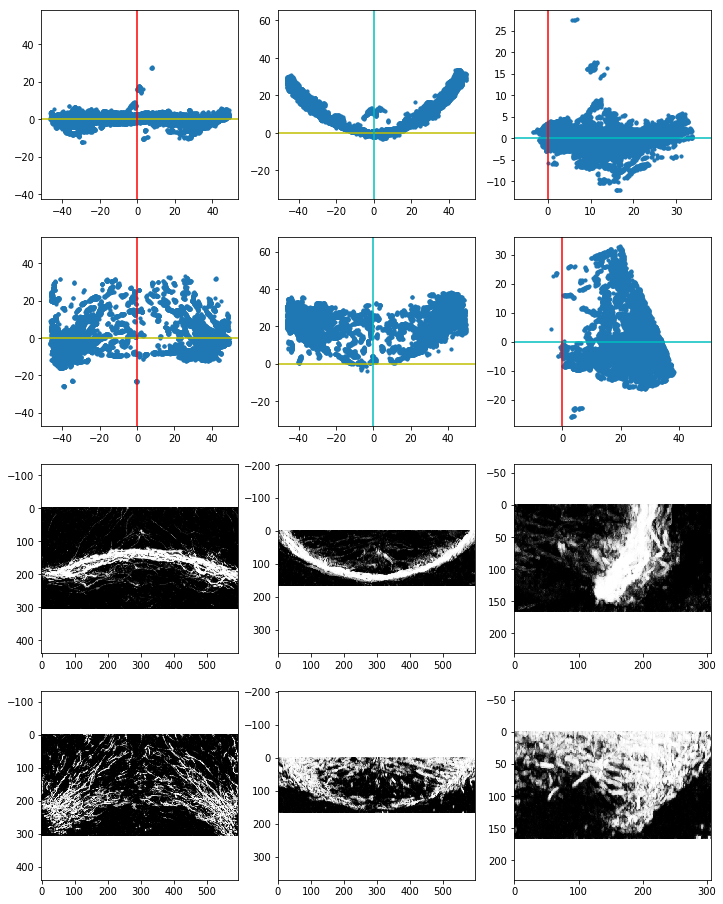

In [46]:
k,df,Ldf,ax = start('106')

In [47]:
model = save_model(k,mm,model)
save_both(k,df,Ldf[0])

Write to .\data\Output_wt03-09-21-29\AT_106_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_106_wt.psi complete


Write to .\data\Output_wt03-09-21-29\AT_107_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_107_wt.psi complete


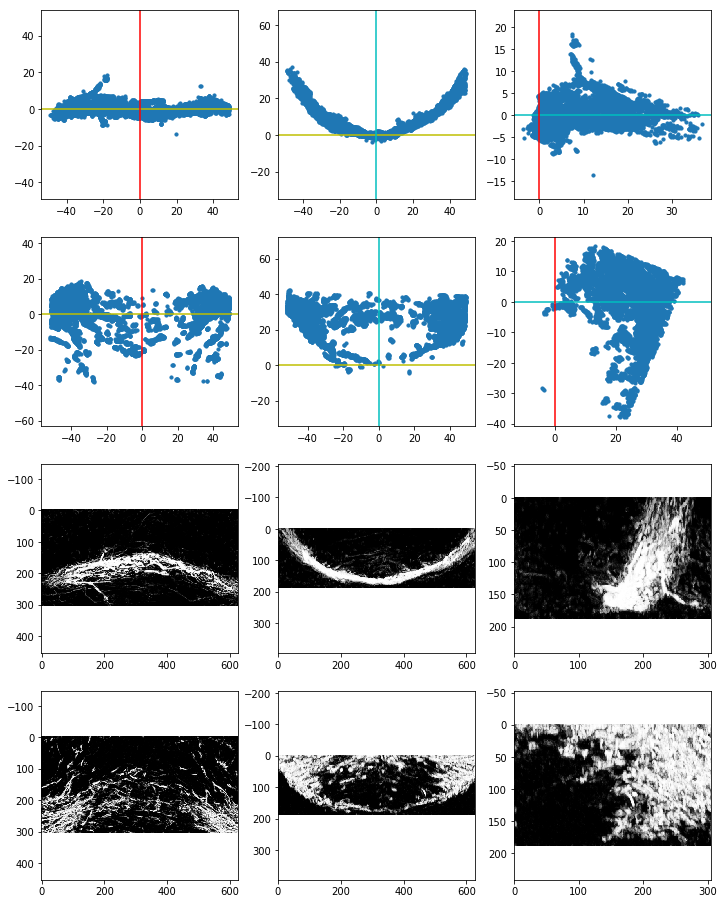

In [49]:
k,df,Ldf,ax = start('107')
save_both(k,df3,Ldf3[0])

In [50]:
model = save_model(k,mm,model)
save_both(k,df,Ldf[0])

Write to .\data\Output_wt03-09-21-29\AT_107_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_107_wt.psi complete


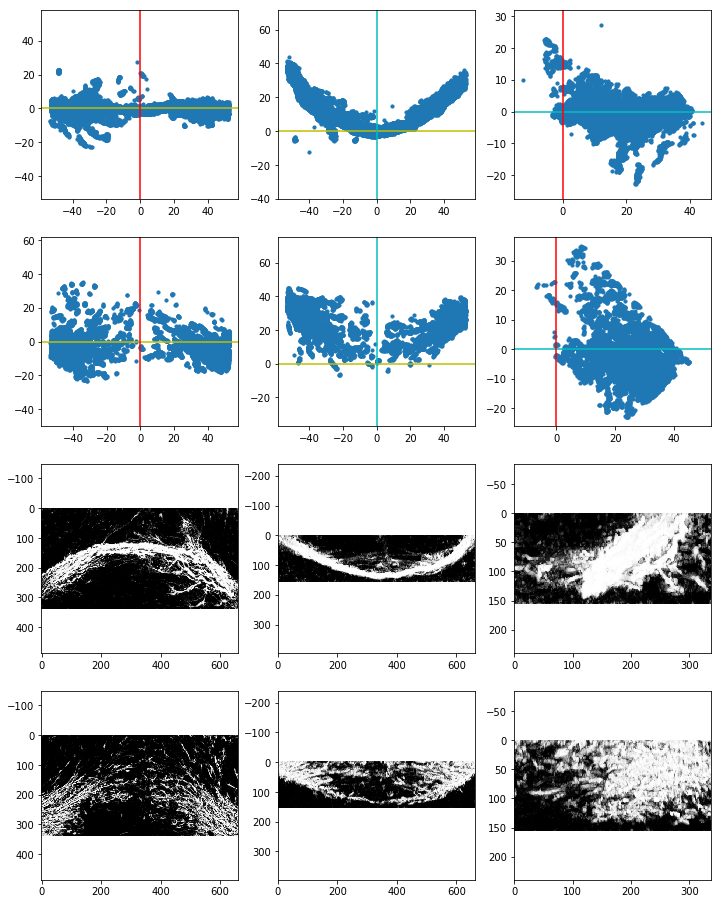

In [51]:
k,df,Ldf,ax = start('108')

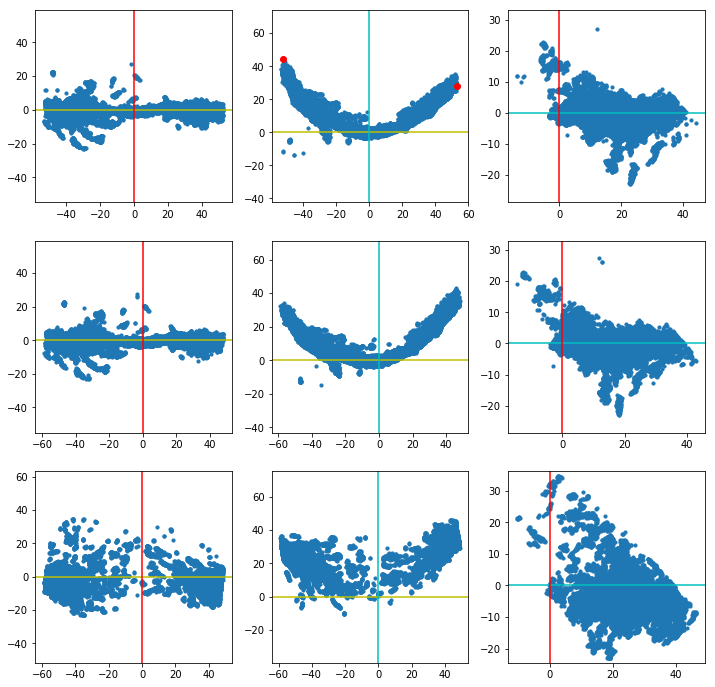

In [52]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

In [53]:
pts.iloc[0].x = 50
pts.iloc[1].z = 38

In [54]:
pts

,x,z
0,50.000000,44.1625
1,52.855046,38.0000


In [55]:
pts.iloc[0].x = -50

In [56]:
ax[0,1].scatter(pts.x,pts.z,c='y')

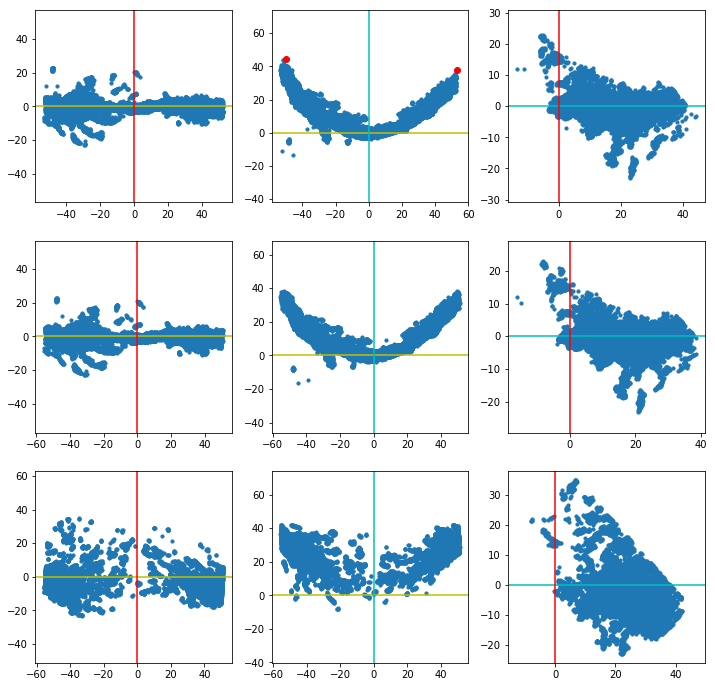

In [57]:

df2,Ldf2,ax = ut.revise_pts(df,Ldf,'z',pts=pts)

c:\users\zfishlab\code\deltascope\deltascope\alignment.py:236: RankWarning: Polyfit may be poorly conditioned
  cf = np.polyfit(pts.x,pts.z,2)
c:\users\zfishlab\code\deltascope\deltascope\alignment.py:257: RankWarning: Polyfit may be poorly conditioned
  cfout = np.polyfit(pts.x-x,pts.z-z,2)


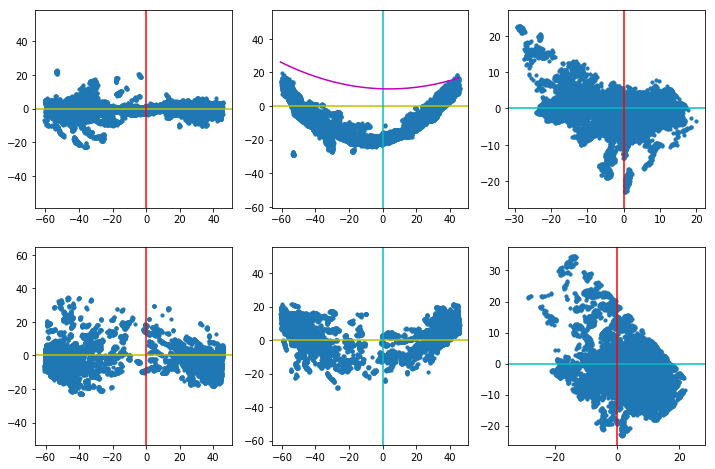

In [58]:
df3,Ldf3,mm,ax = ut.ch_vertex(df2,Ldf2,pts=pts)

c:\users\zfishlab\code\deltascope\deltascope\alignment.py:236: RankWarning: Polyfit may be poorly conditioned
  cf = np.polyfit(pts.x,pts.z,2)
c:\users\zfishlab\code\deltascope\deltascope\alignment.py:257: RankWarning: Polyfit may be poorly conditioned
  cfout = np.polyfit(pts.x-x,pts.z-z,2)


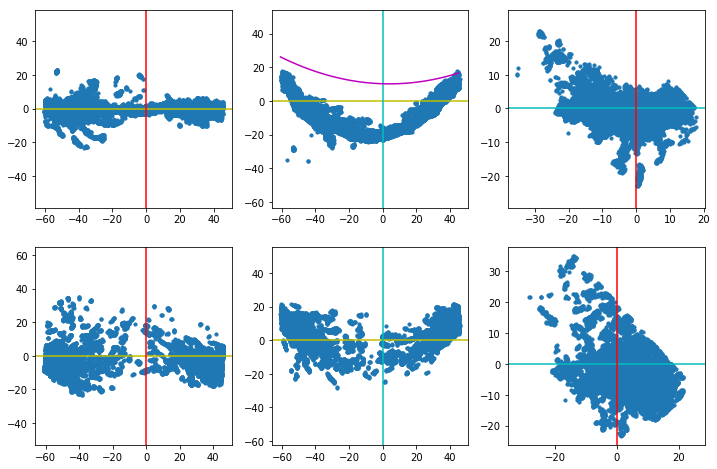

In [59]:
df3,Ldf3,mm,ax = ut.ch_vertex(df2,Ldf2,pts=pts)

In [60]:
pts = pick_pts(-55,40,-8,-2,50,35) #these are essentially random numbers for example


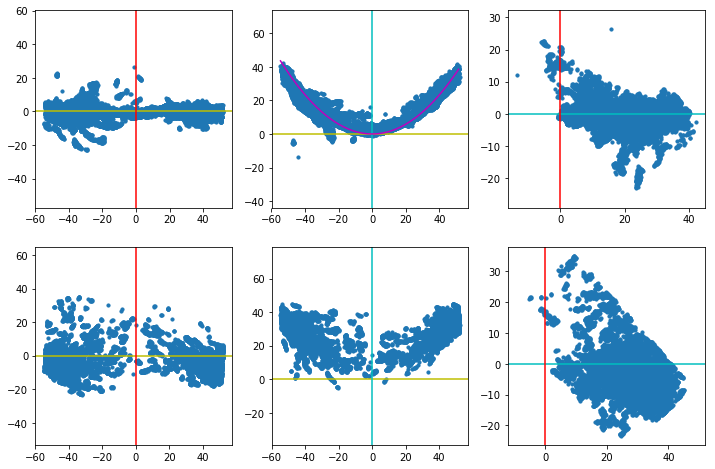

In [61]:

df3,Ldf3,mm,ax = ut.ch_vertex(df2,Ldf2,pts=pts)

In [62]:
model = save_model(k,mm,model)
save_both(k,df3,Ldf3[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


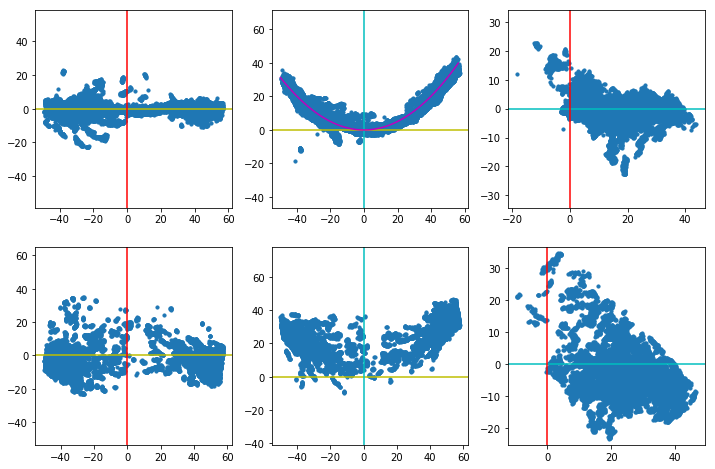

In [63]:
df2,Ldf2,mm,ax = ut.ch_vertex(df1,Ldf1)

In [64]:
pts = pick_pts(-53,40,-9,0,60,40)

In [65]:
model = save_model(k,mm,model)
save_both(k,df3,Ldf3[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


In [66]:
model = save_model(k,mm,model)
save_both(k,df,Ldf[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


In [67]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


In [68]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


In [69]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


sample rejected for being truncated at midline. likely improper collection that was not superficial enough to capture POC.

In [70]:
model = save_model(k,mm,model)
save_both(k,df,Ldf[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


In [71]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


In [72]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


In [73]:
model = save_model(k,mm,model)
save_both(k,df3,Ldf3[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


In [74]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


In [75]:
klist


dict_keys(['101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143'])

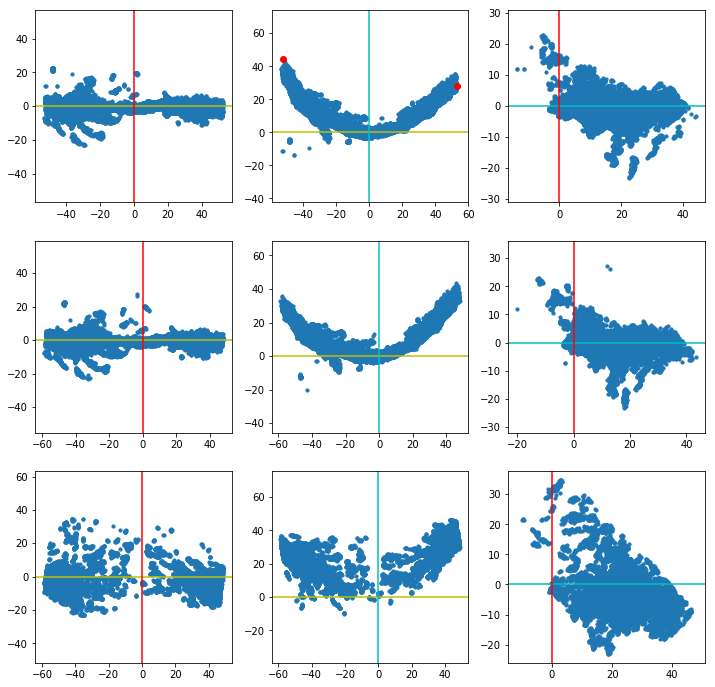

In [76]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

In [77]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_108_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_108_wt.psi complete


Commissure is obviously physically deformed due to pressure from coverslip and will not take parabolic curve well. skipping sample.

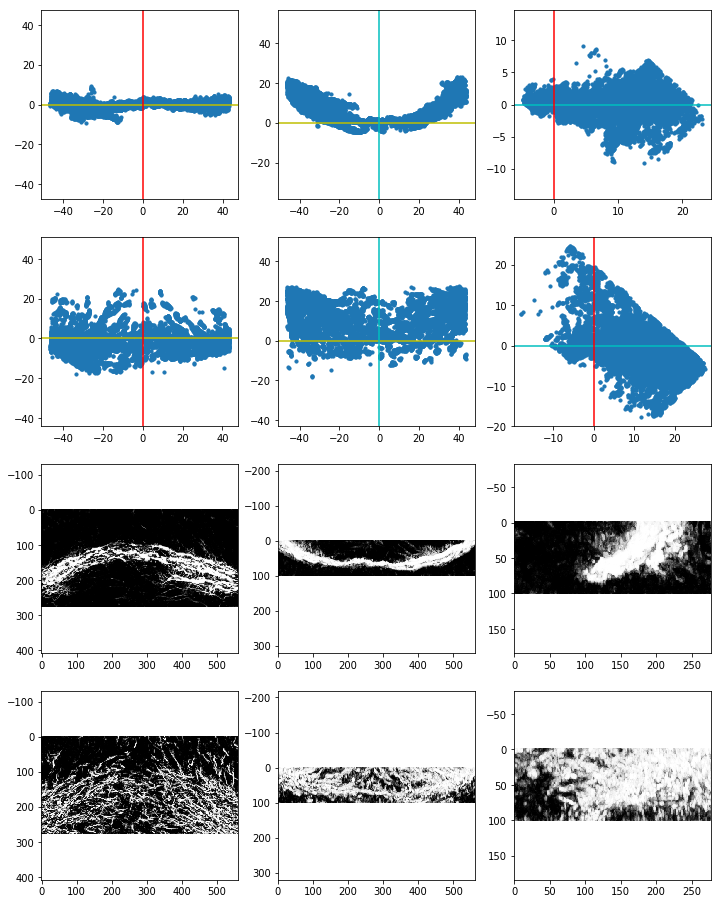

In [78]:
k,df,Ldf,ax = start('122')

In [79]:
model = save_model(k,mm,model)
save_both(k,df,Ldf[0])

Write to .\data\Output_wt03-09-21-29\AT_122_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_122_wt.psi complete


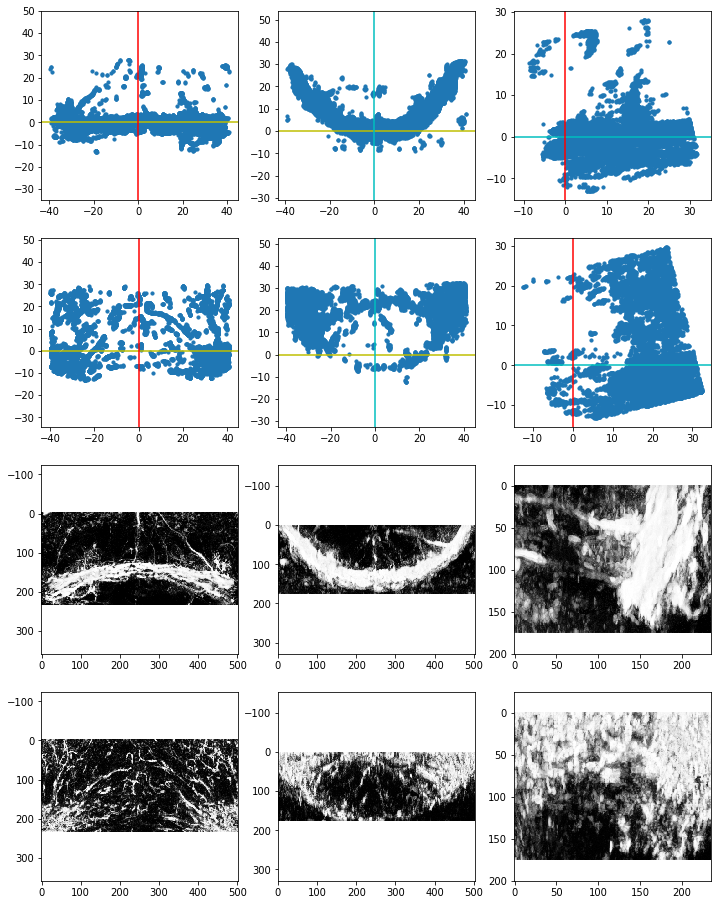

In [80]:
k,df,Ldf,ax = start('123')

In [81]:
model = save_model(k,mm,model)
save_both(k,df,Ldf[0])

Write to .\data\Output_wt03-09-21-29\AT_123_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_123_wt.psi complete


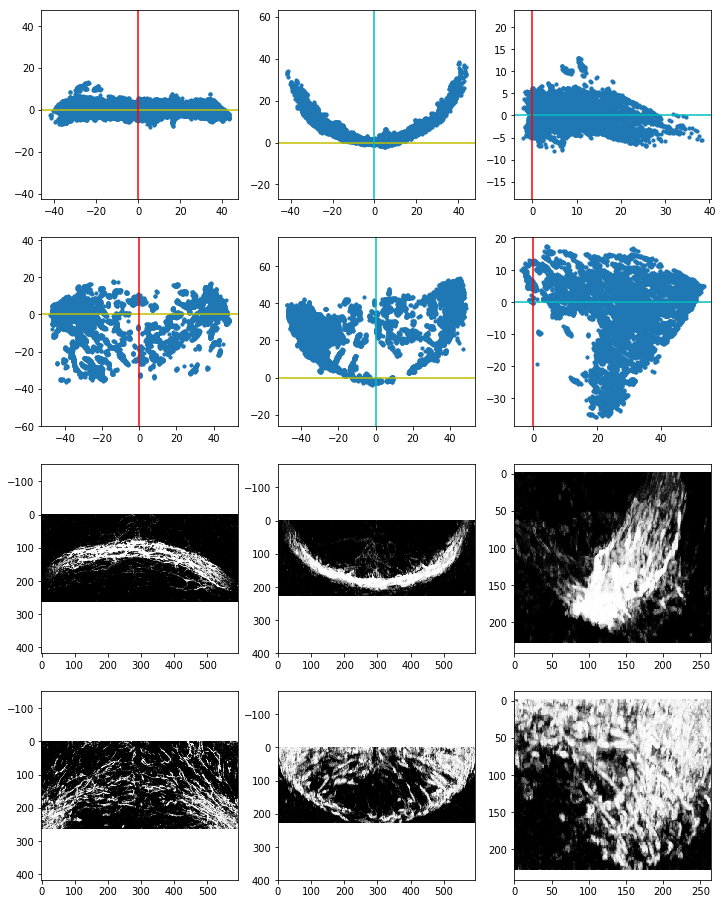

In [82]:
k,df,Ldf,ax = start('124')

In [83]:
model = save_model(k,mm,model)
save_both(k,df,Ldf[0])

Write to .\data\Output_wt03-09-21-29\AT_124_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_124_wt.psi complete


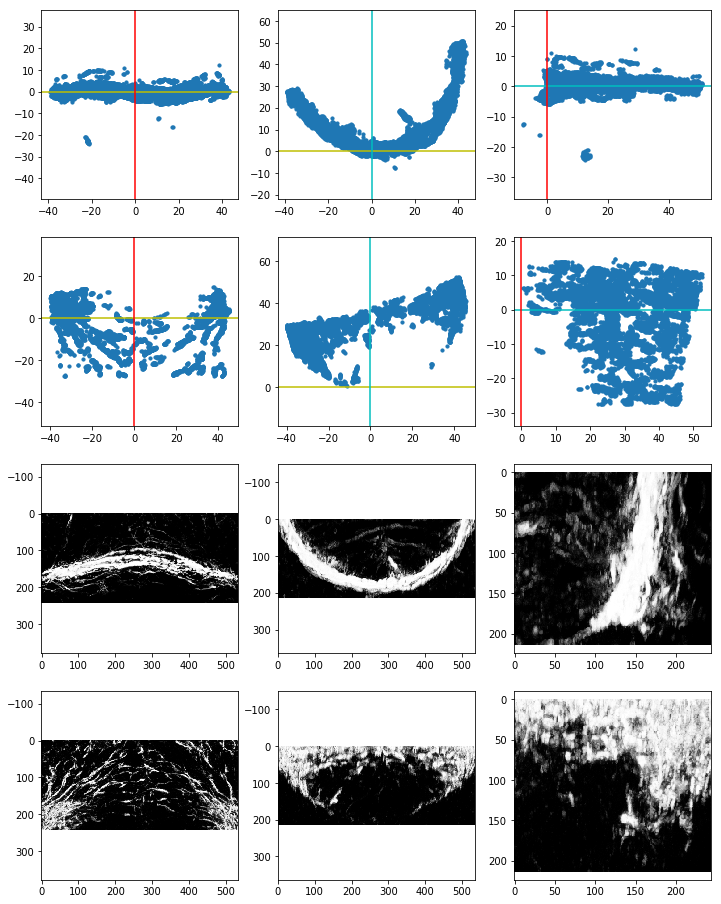

In [84]:
k,df,Ldf,ax = start('125')

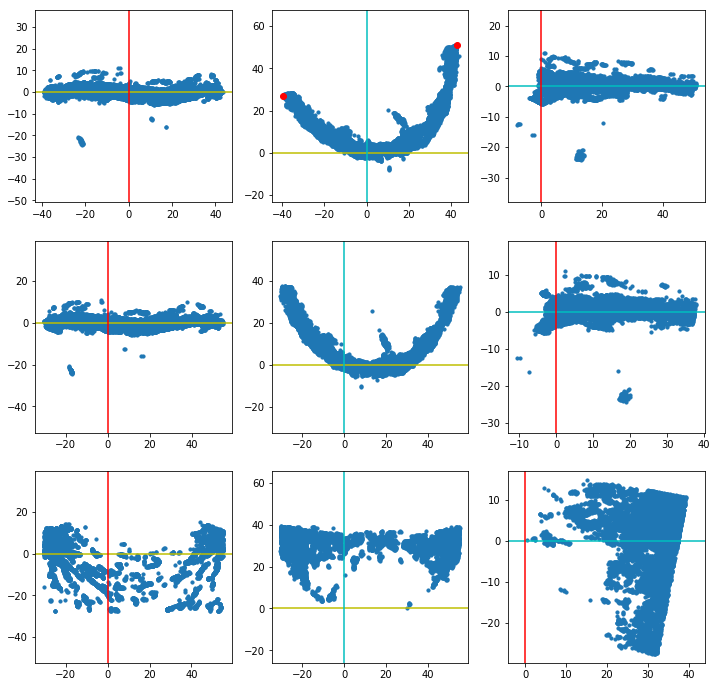

In [85]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

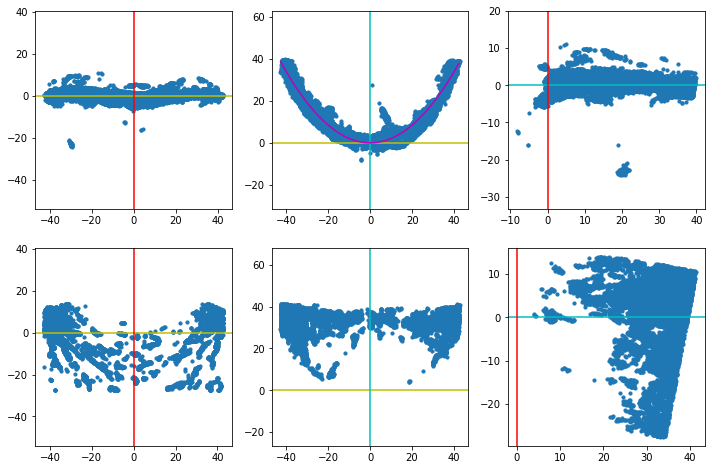

In [86]:
df2,Ldf2,mm,ax = ut.ch_vertex(df1,Ldf1)

In [87]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_125_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_125_wt.psi complete


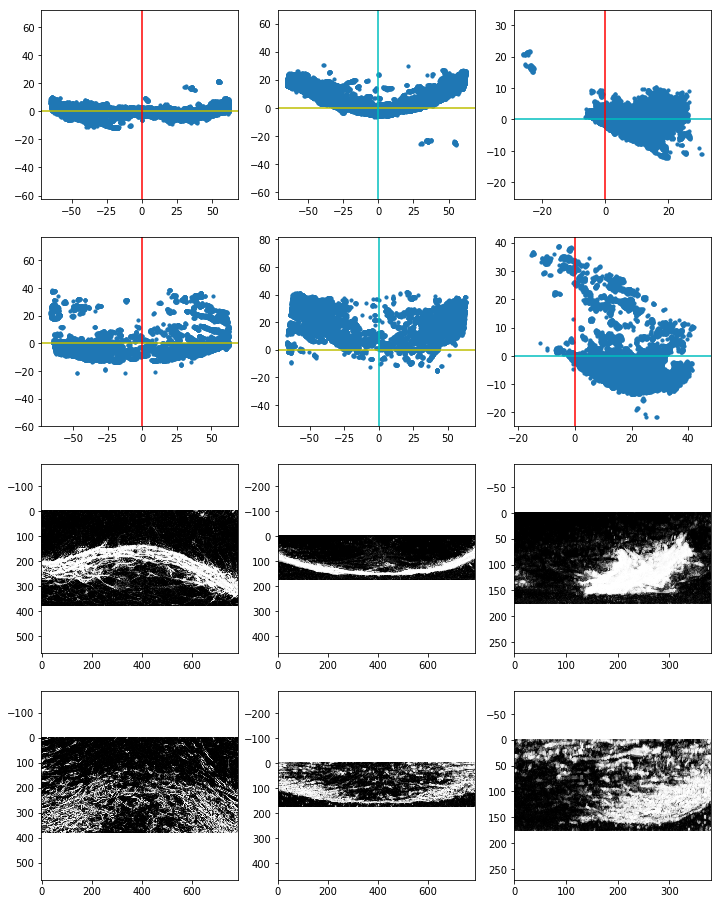

In [88]:
k,df,Ldf,ax = start('126')

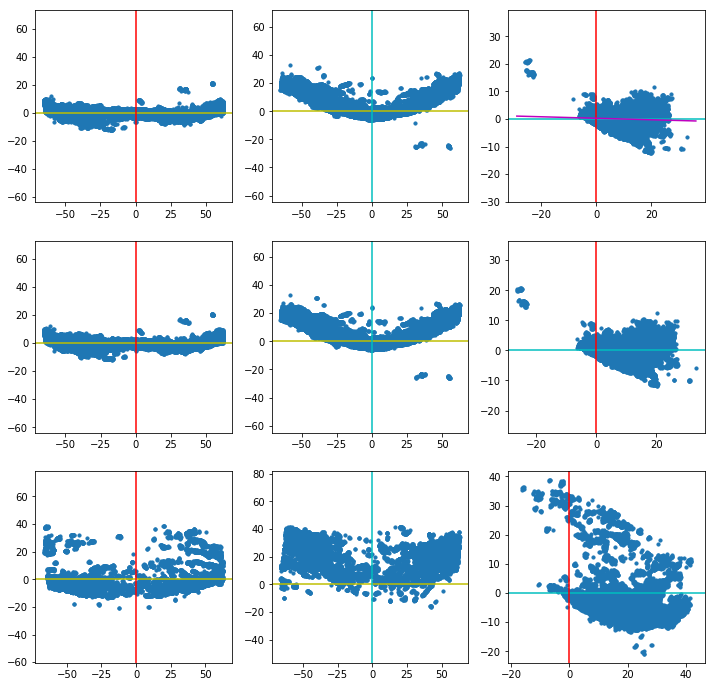

In [89]:
df1,Ldf1,ax,p = ut.check_yz(df,Ldf)

In [90]:
p

poly1d([-0.02718542,  0.25853679])

In [91]:
p1 = [-5/20, 2]

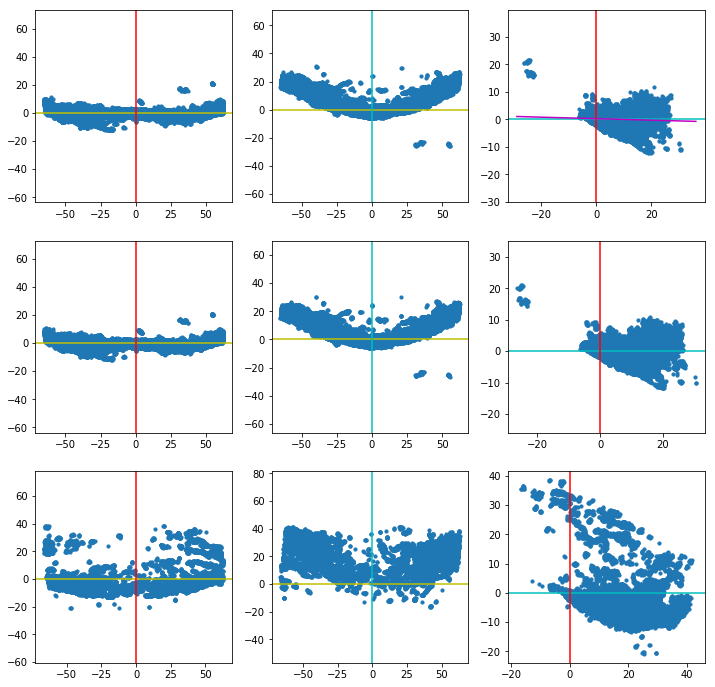

In [92]:
df1,Ldf1,ax,p1 = ut.check_yz(df,Ldf)

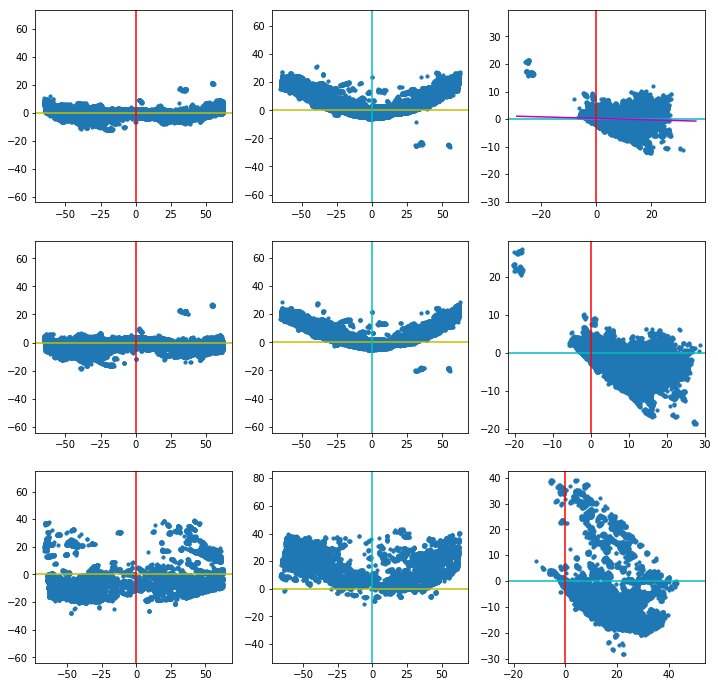

In [93]:
df1,Ldf1,ax,p = ut.check_yz(df,Ldf,mm=p1)

In [94]:
p1

poly1d([-0.02718542,  0.25853679])

In [95]:
p2 =[-.5, 2]

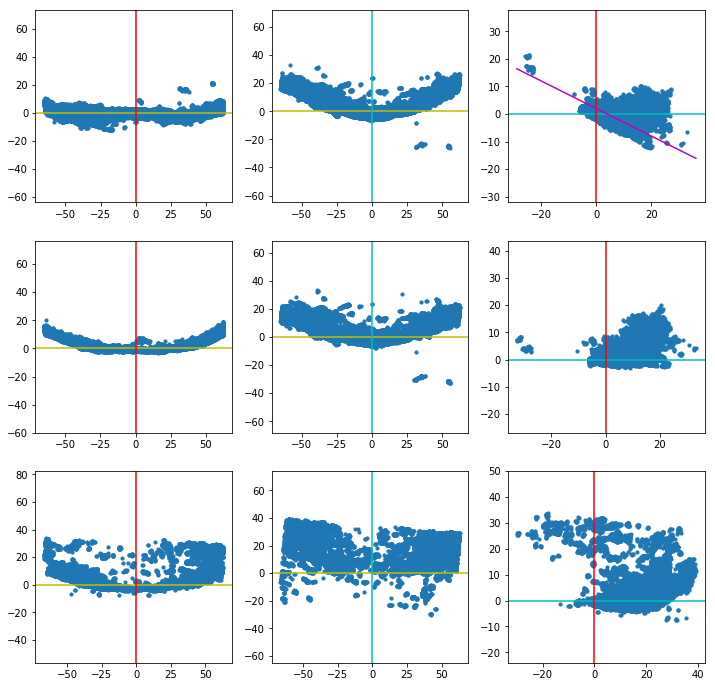

In [96]:
df1,Ldf1,ax,p = ut.check_yz(df,Ldf,mm=p2)

In [97]:
model = save_model(k,mm,model)
save_both(k,df,Ldf[0])

Write to .\data\Output_wt03-09-21-29\AT_126_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_126_wt.psi complete


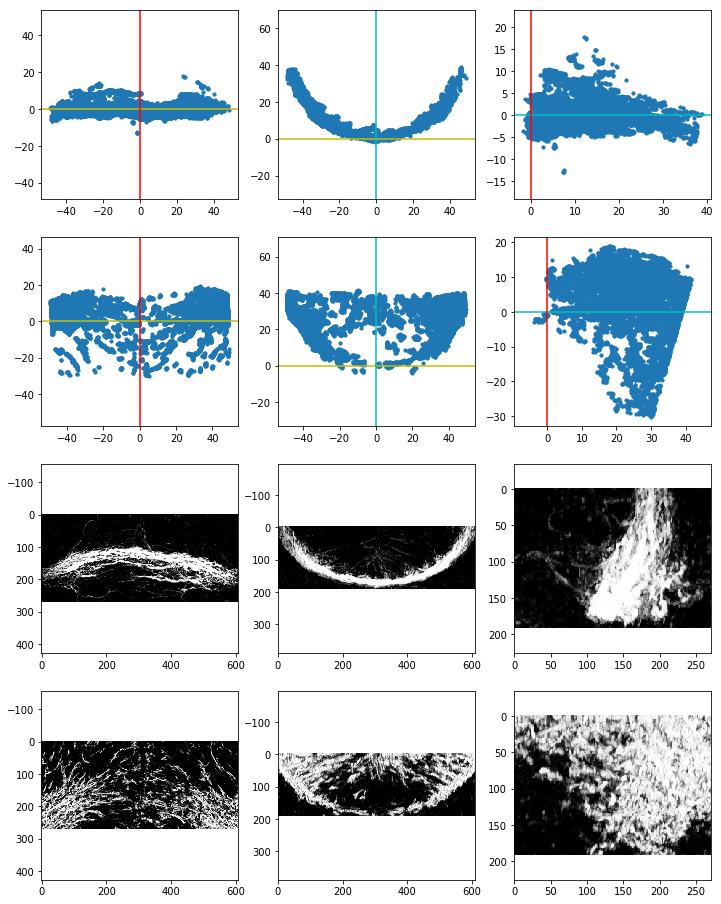

In [98]:
k,df,Ldf,ax=start('129')

Write to .\data\Output_wt03-09-21-29\AT_129_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_129_wt.psi complete


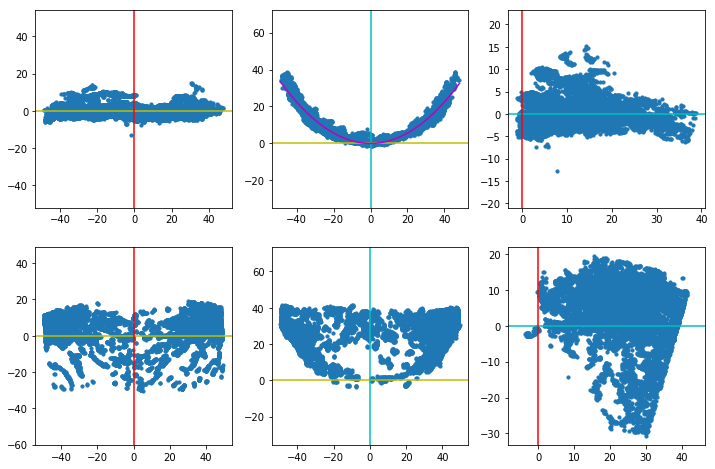

In [99]:
df,Ldf,mm,ax = ut.ch_vertex(df,Ldf)
model = save_model(k,mm,model)
save_both(k,df,Ldf[0])

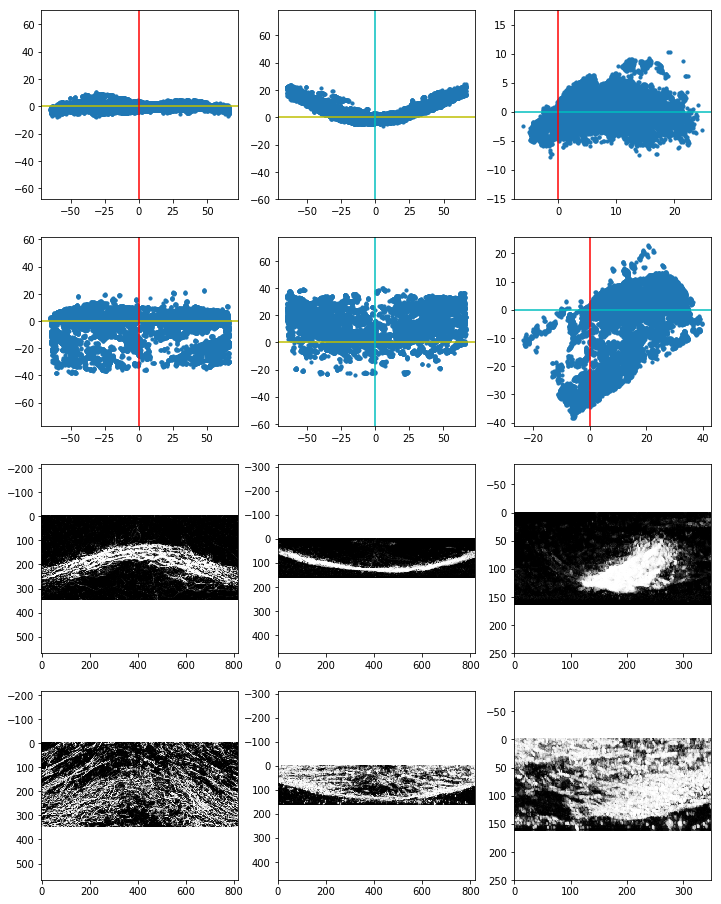

In [100]:
k,df,Ldf,ax=start('130')

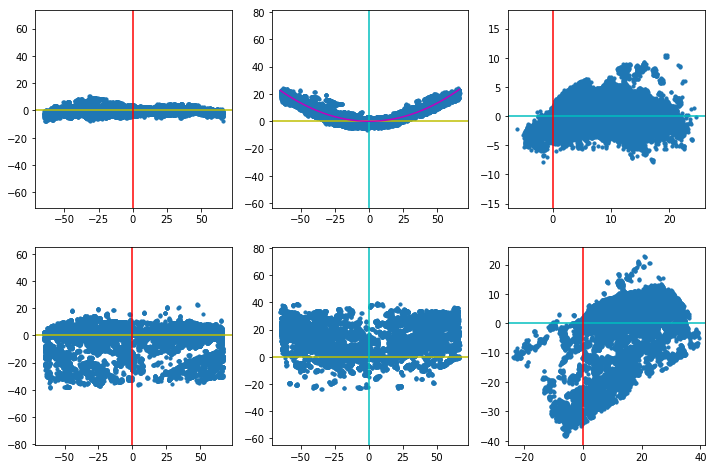

In [101]:
df,Ldf,mm,ax = ut.ch_vertex(df,Ldf)

In [102]:
model = save_model(k,mm,model)
save_both(k,df,Ldf[0])

Write to .\data\Output_wt03-09-21-29\AT_130_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_130_wt.psi complete


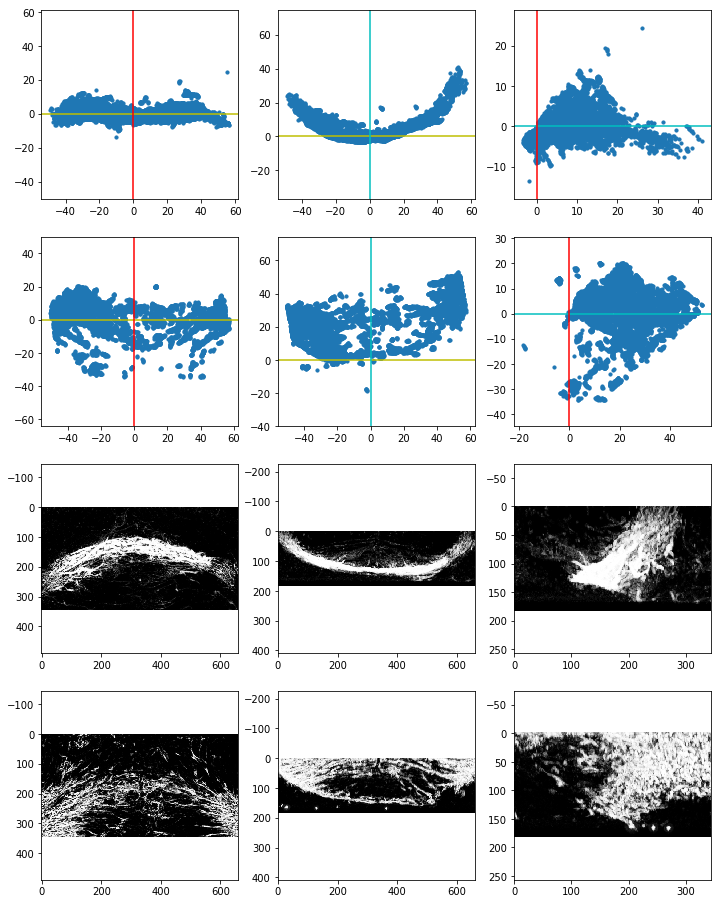

In [103]:
k,df,Ldf,ax=start('131')

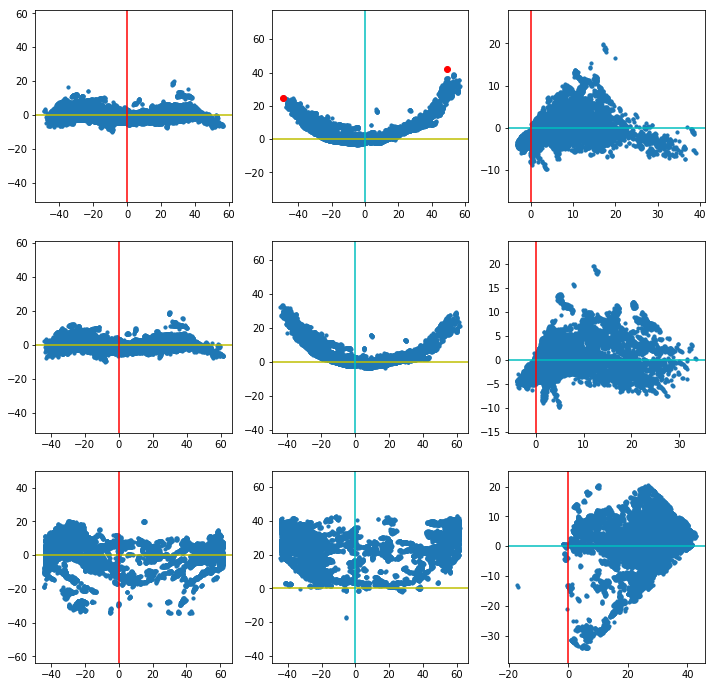

In [104]:
df,Ldf,pts,ax = ut.check_pts(df,Ldf,'z')

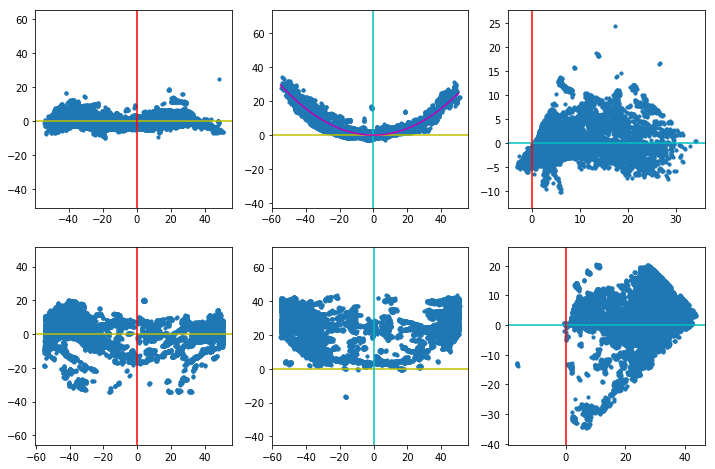

In [105]:
df2,Ldf2,mm,ax = ut.ch_vertex(df,Ldf)

In [106]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_131_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_131_wt.psi complete


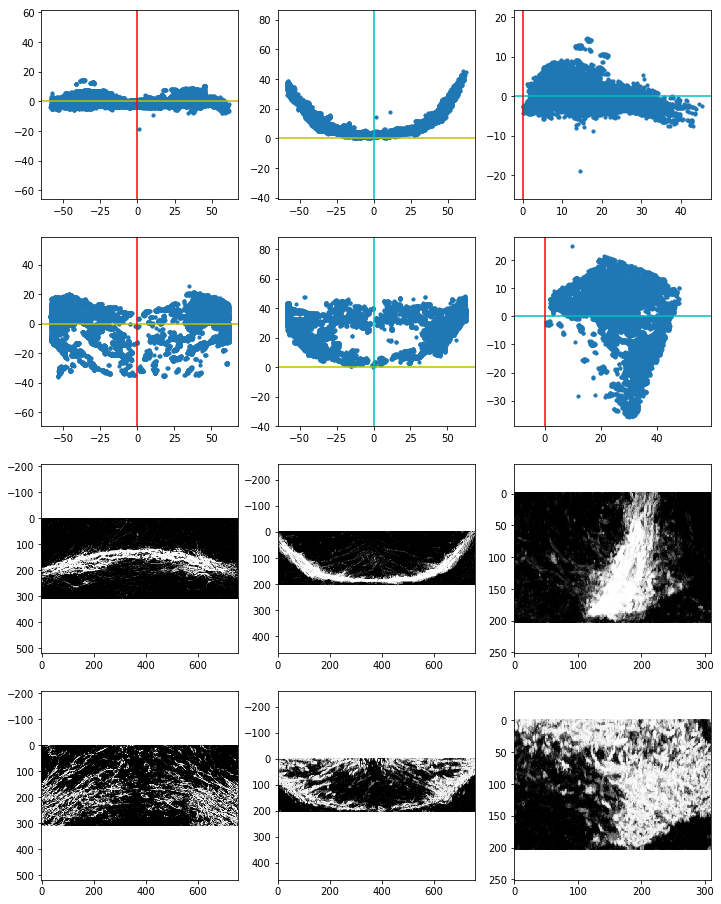

In [107]:
k,df,Ldf,ax=start('128')

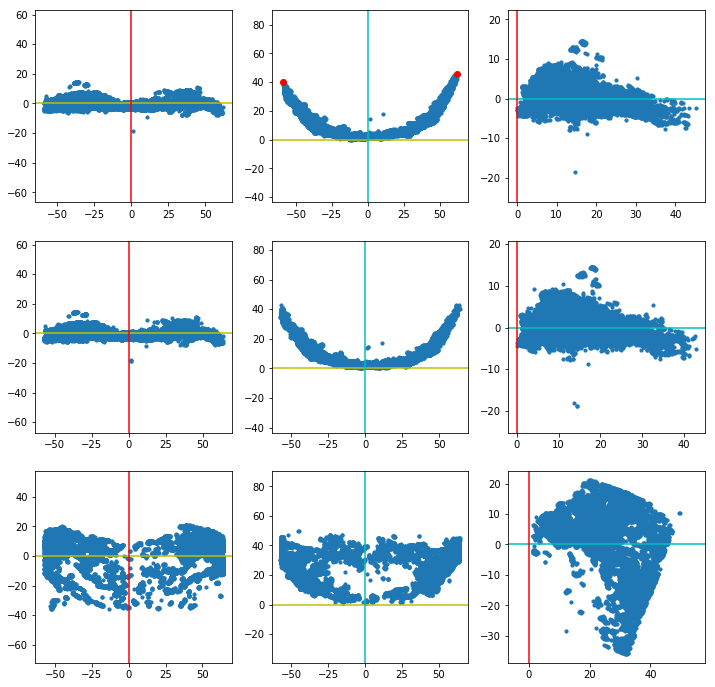

In [108]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

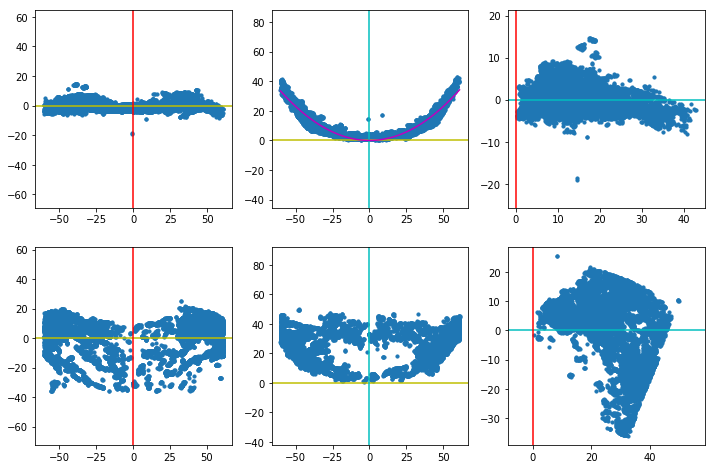

In [109]:
df2,Ldf2,mm,ax = ut.ch_vertex(df1,Ldf1)

In [110]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_128_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_128_wt.psi complete


In [111]:
model

,a,b,c
101,0.010452,-4.985302e-17,-1.016496e-14
102,0.007950,-3.772889e-17,6.879950e-15
104,0.013104,-7.465448e-16,-1.424932e-14
105,0.013104,-7.465448e-16,-1.424932e-14
106,0.013104,-7.465448e-16,-1.424932e-14
107,0.013104,-7.465448e-16,-1.424932e-14
108,0.014586,-2.110834e-16,-1.755301e-14
108,0.012598,-6.073178e-16,7.742279e-15
108,0.012598,-6.073178e-16,7.742279e-15
108,0.012598,-6.073178e-16,7.742279e-15


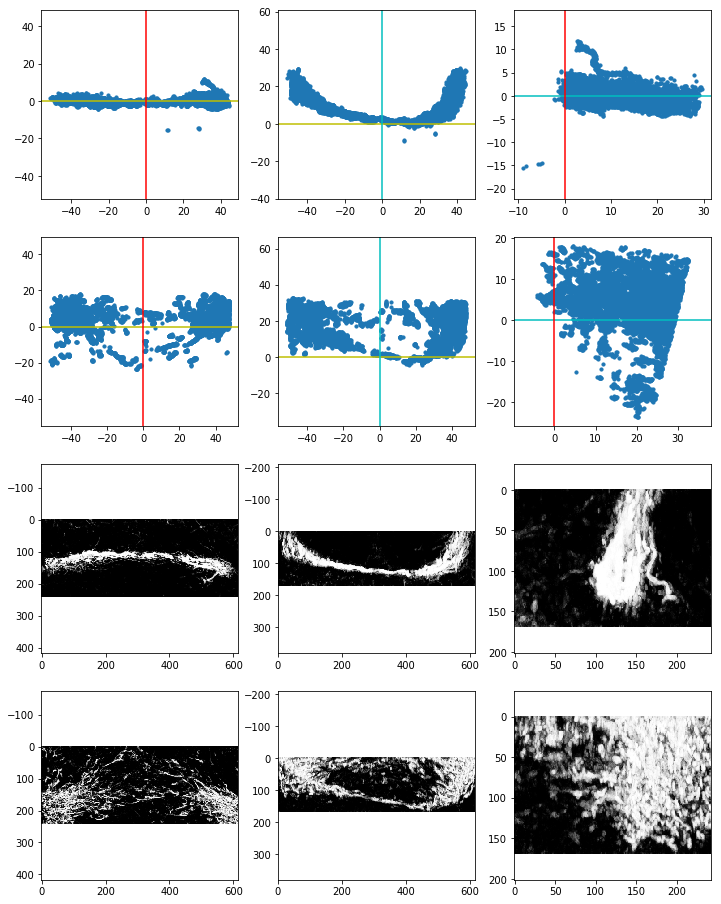

In [112]:
k,df,Ldf,ax=start('127')

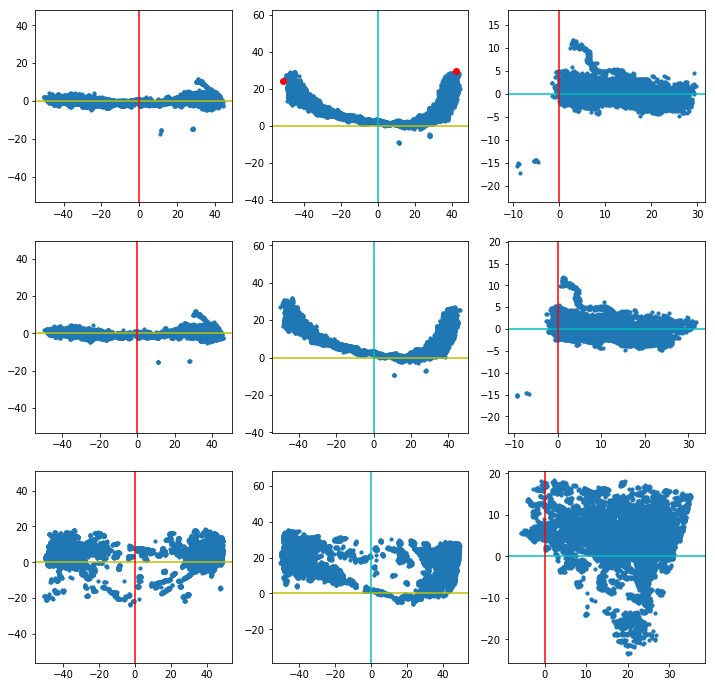

In [113]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

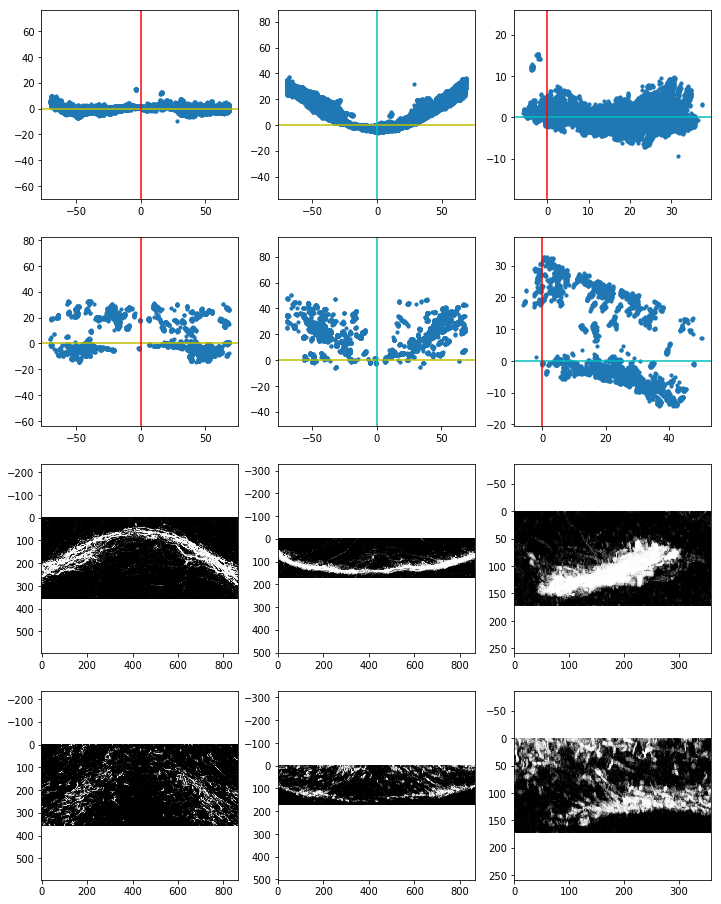

In [114]:
k,df,Ldf,ax=start('132')

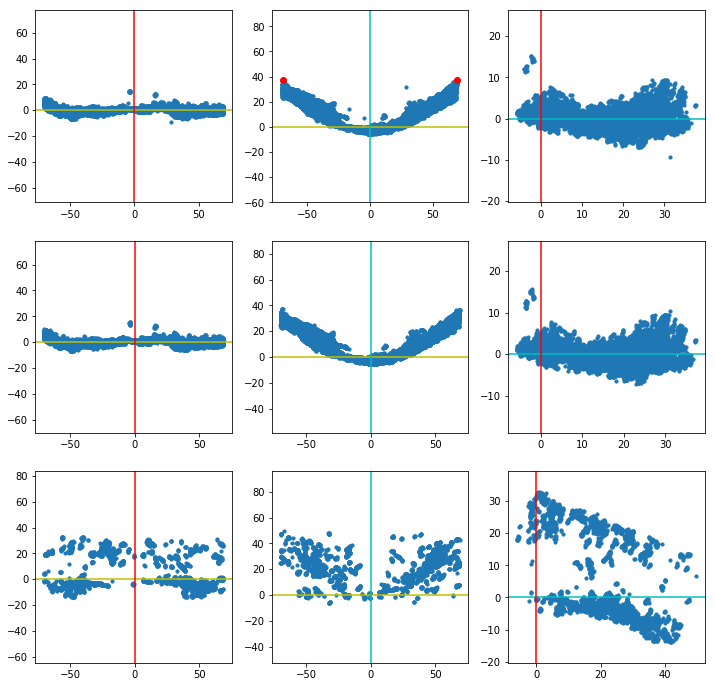

In [115]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

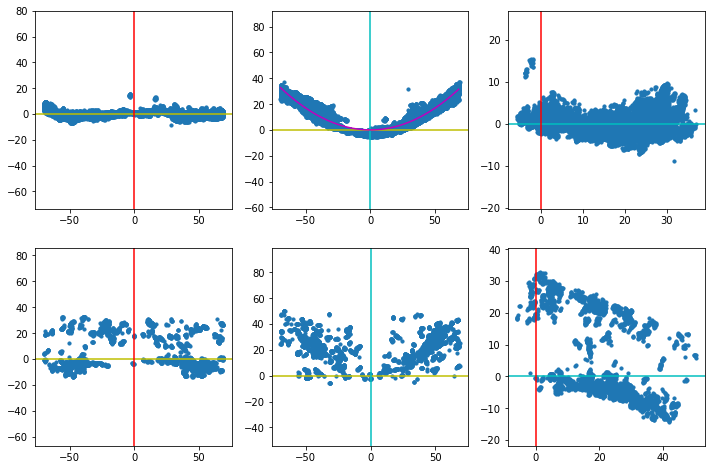

In [116]:
df2,Ldf2,mm,ax = ut.ch_vertex(df1,Ldf1)

In [117]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_132_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_132_wt.psi complete


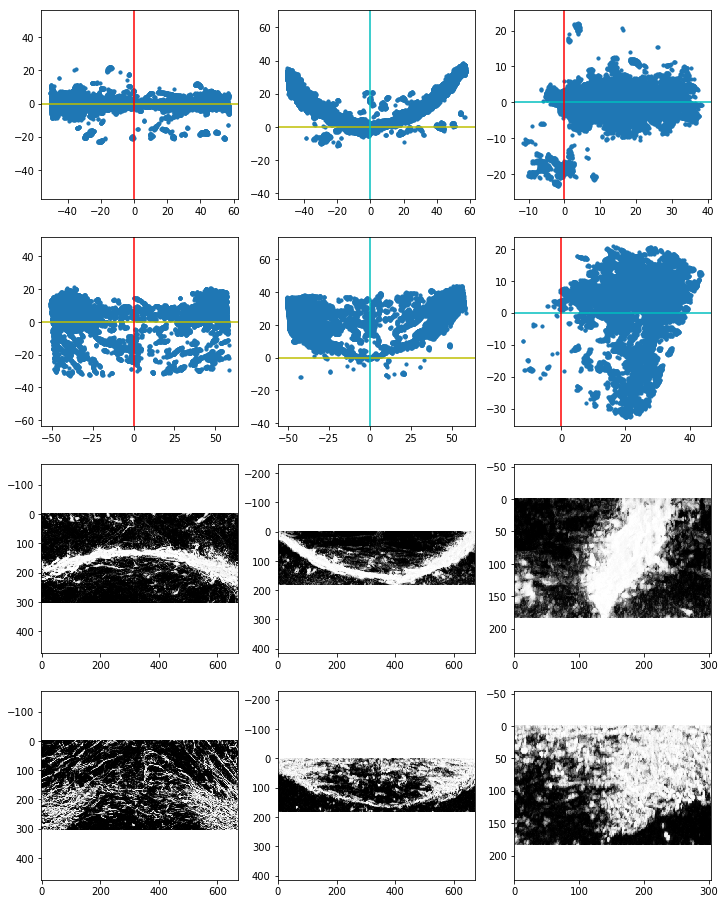

In [118]:
k,df,Ldf,ax=start('133')

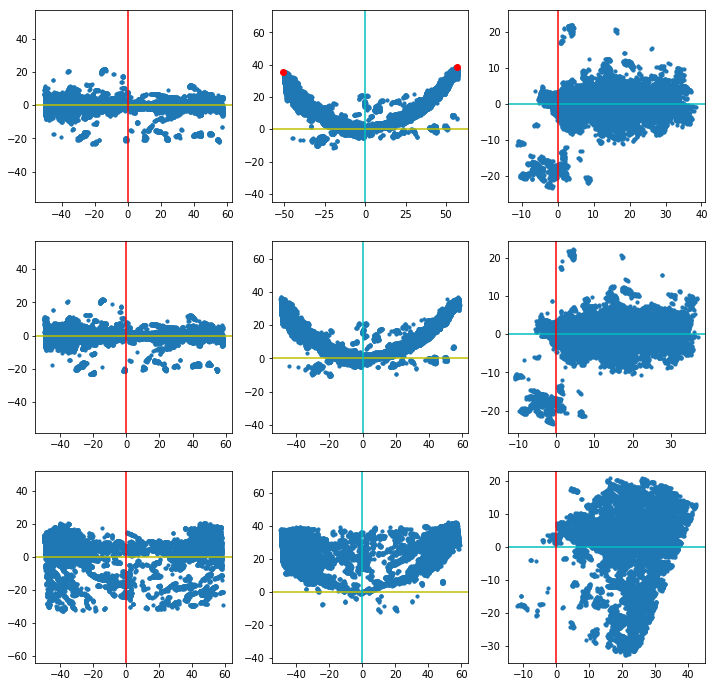

In [119]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

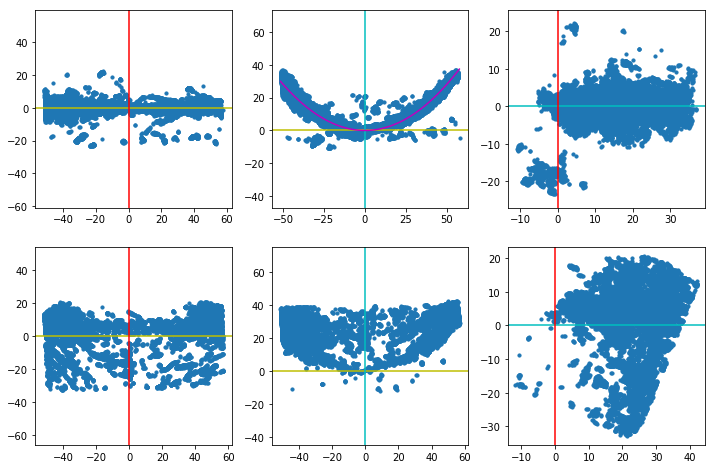

In [120]:
df2,Ldf2,mm,ax = ut.ch_vertex(df1,Ldf1)

In [121]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_133_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_133_wt.psi complete


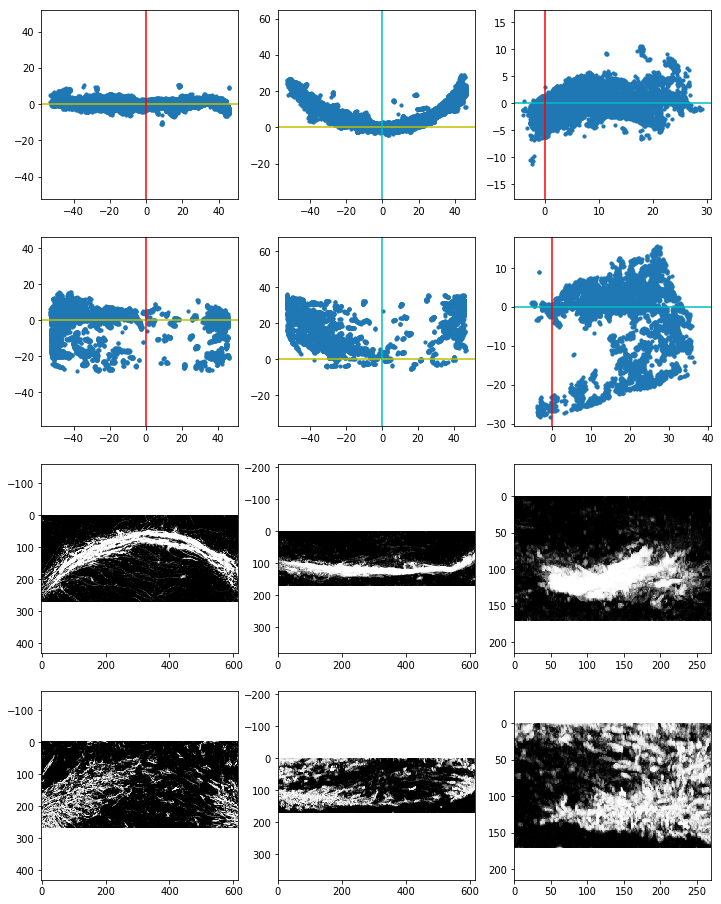

In [122]:
k,df,Ldf,ax=start('134')

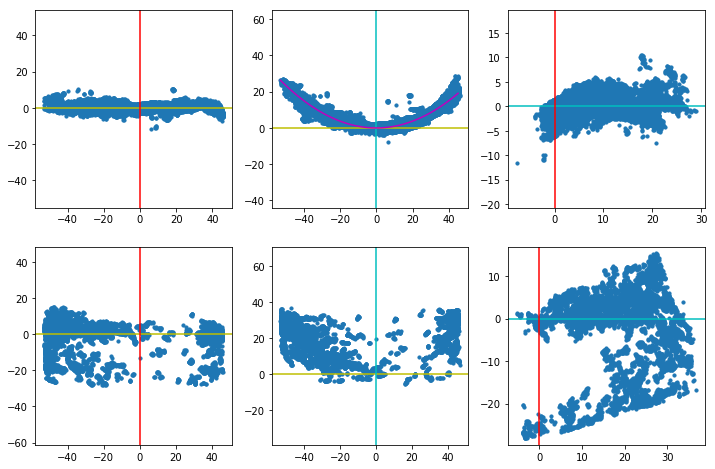

In [123]:
df2,Ldf2,mm,ax = ut.ch_vertex(df,Ldf)

In [124]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_134_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_134_wt.psi complete


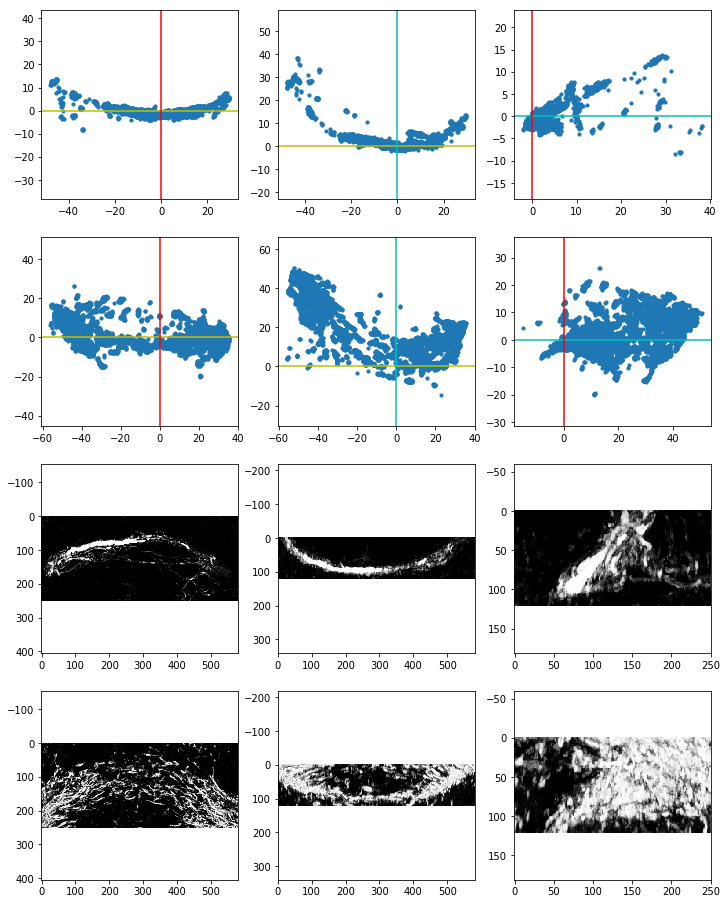

In [125]:
k,df,Ldf,ax=start('135')

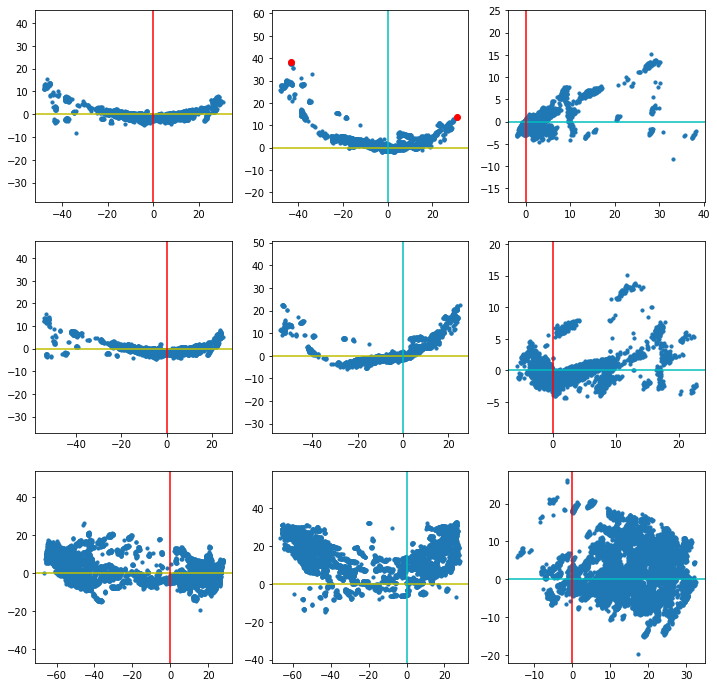

In [126]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

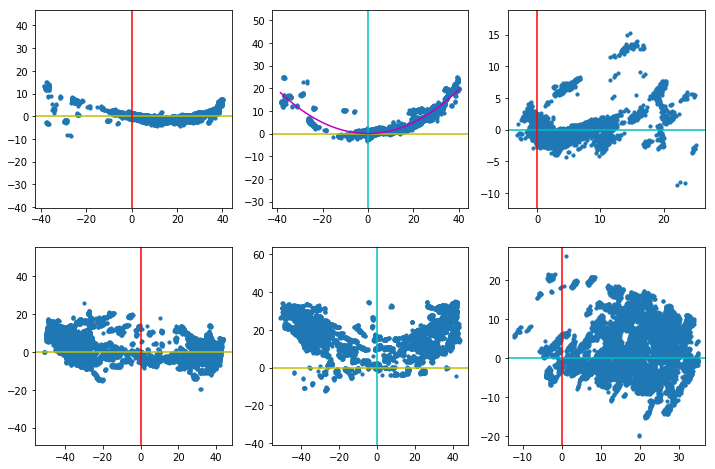

In [127]:
df2,Ldf2,mm,ax = ut.ch_vertex(df1,Ldf1)

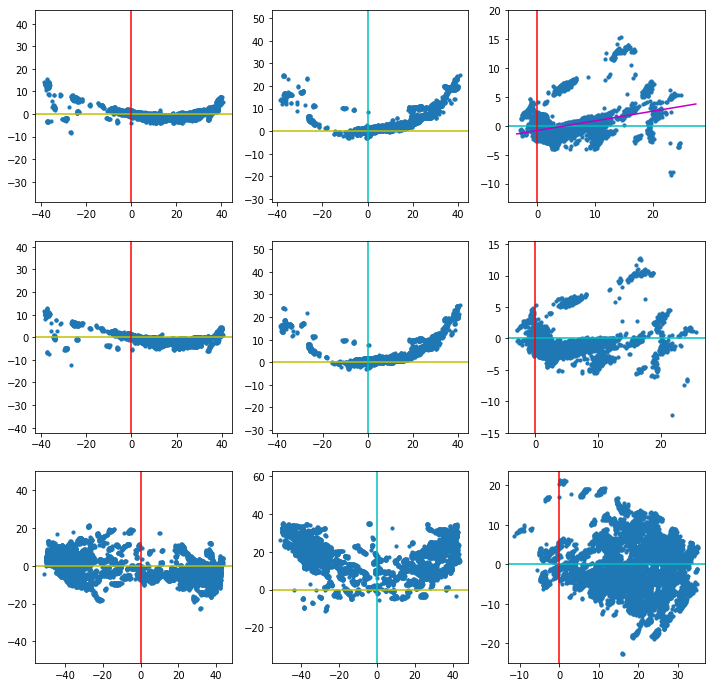

In [128]:
df3,Ldf3,ax,p = ut.check_yz(df2,Ldf2)

In [129]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_135_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_135_wt.psi complete


# Wrapping up: after all samples are processed
Once all of the data has been processed, we want to save the model data we collected to a file for future reference.

In [130]:
model.to_csv(os.path.join(outdir,'model.csv'))

Additionally, it can be helpful to export a html or pdf version of the notebook that preserves all of the plots generated during the alignment process. To do so, use the Jupyter Lab menu interface: File > Export Notebook As > HTML or PDF.

In [131]:
klist

dict_keys(['101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143'])

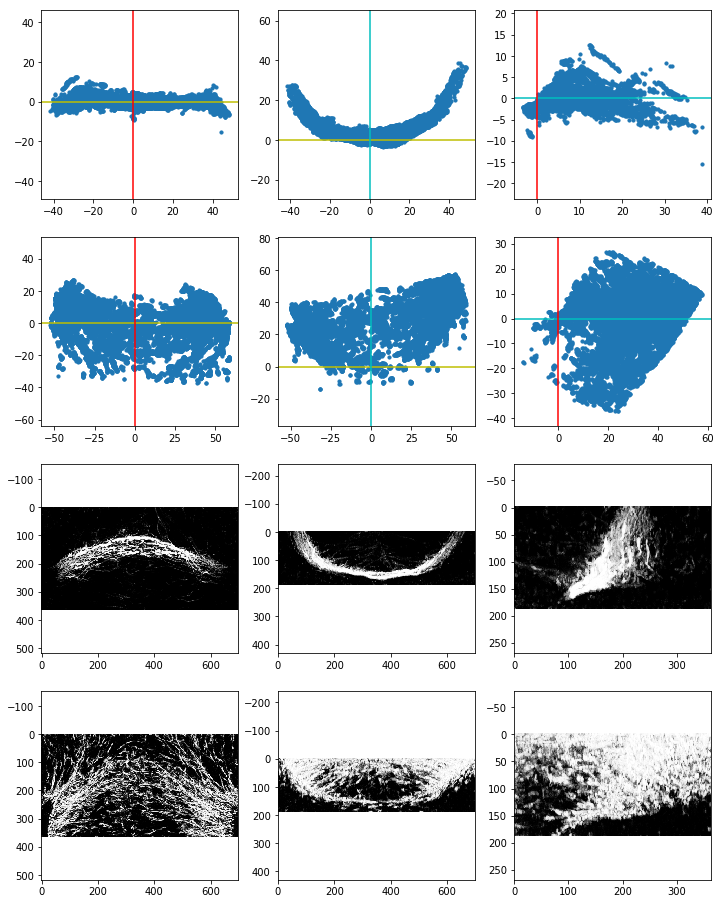

In [132]:
k,df,Ldf,ax = start('136')

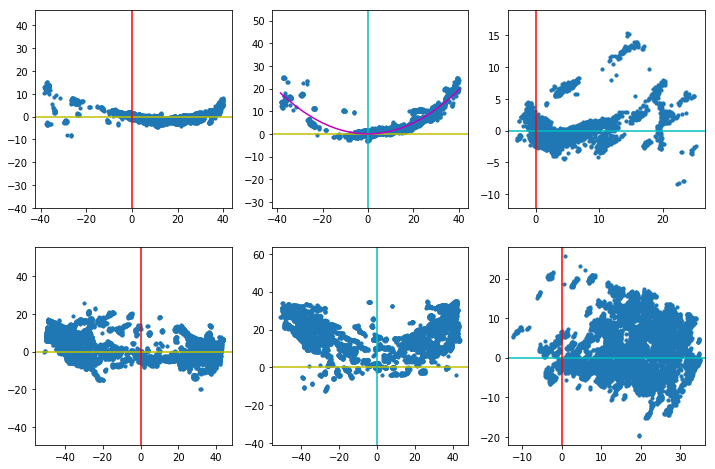

In [133]:
df2,Ldf2,mm,ax = ut.ch_vertex(df1,Ldf1)

In [134]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_136_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_136_wt.psi complete


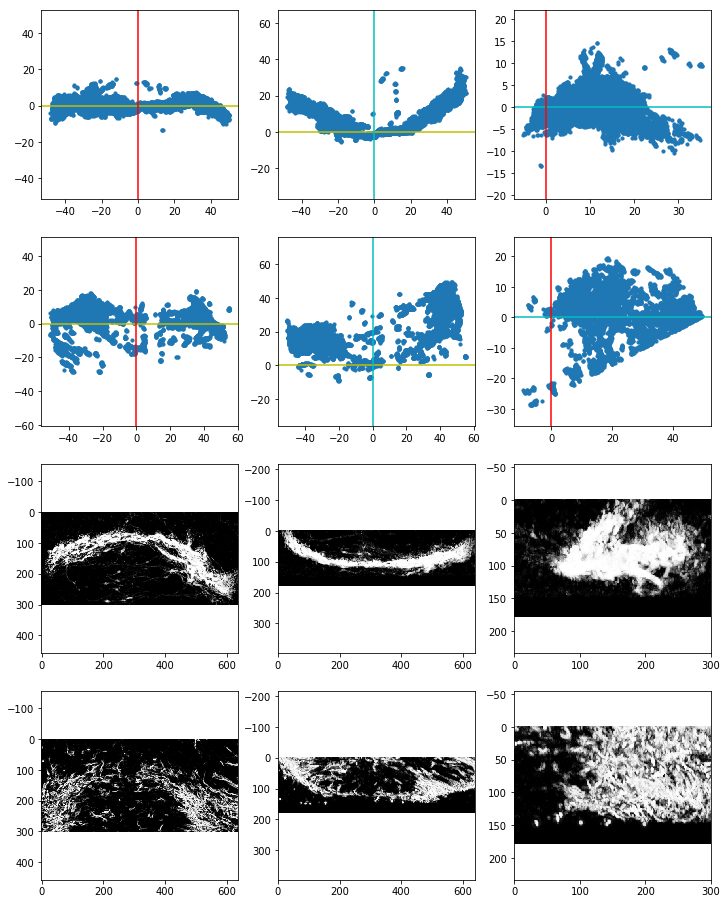

In [135]:
k,df,Ldf,ax = start('137')

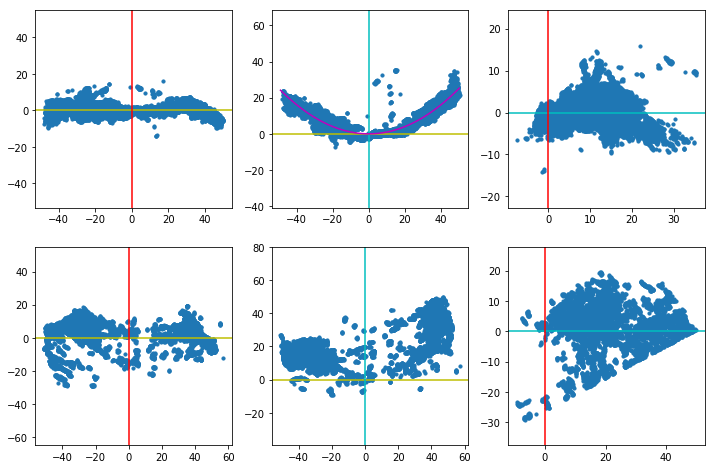

In [136]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [137]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_137_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_137_wt.psi complete


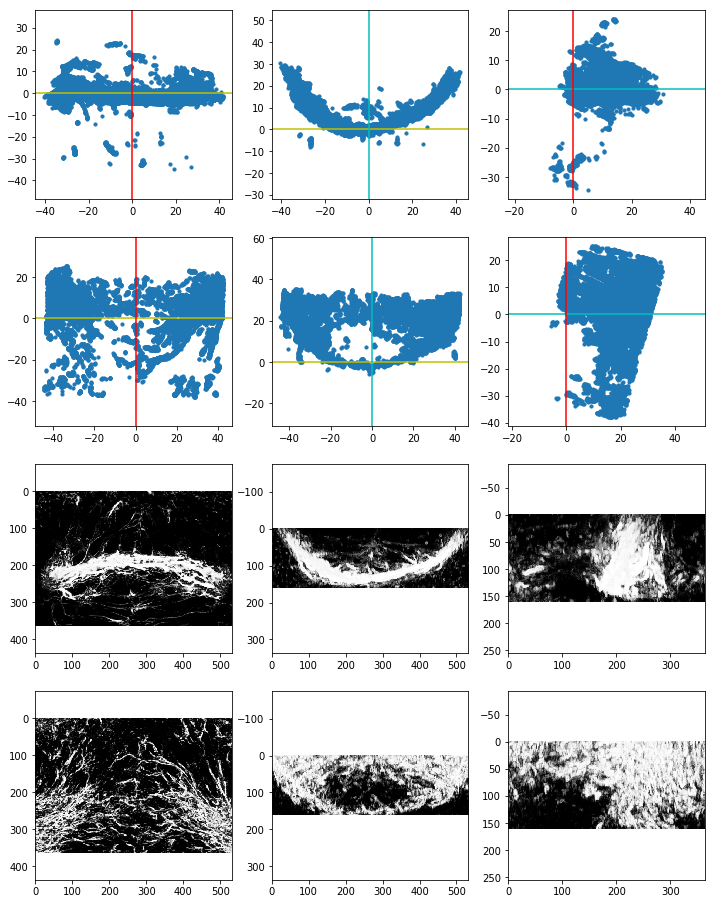

In [138]:
k,df,Ldf,ax = start('138')

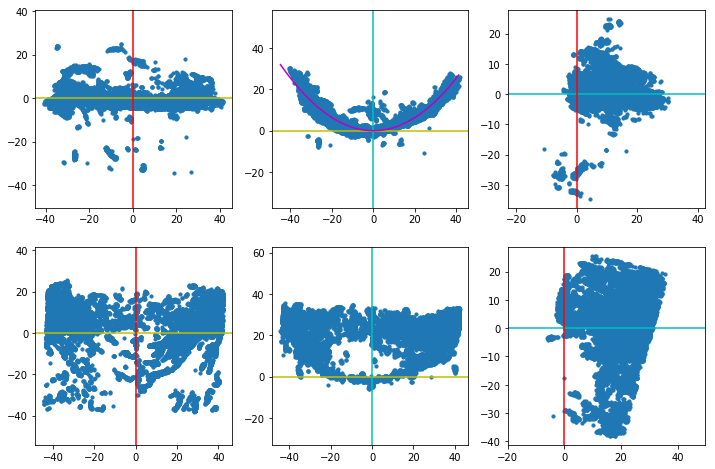

In [139]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [140]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_138_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_138_wt.psi complete


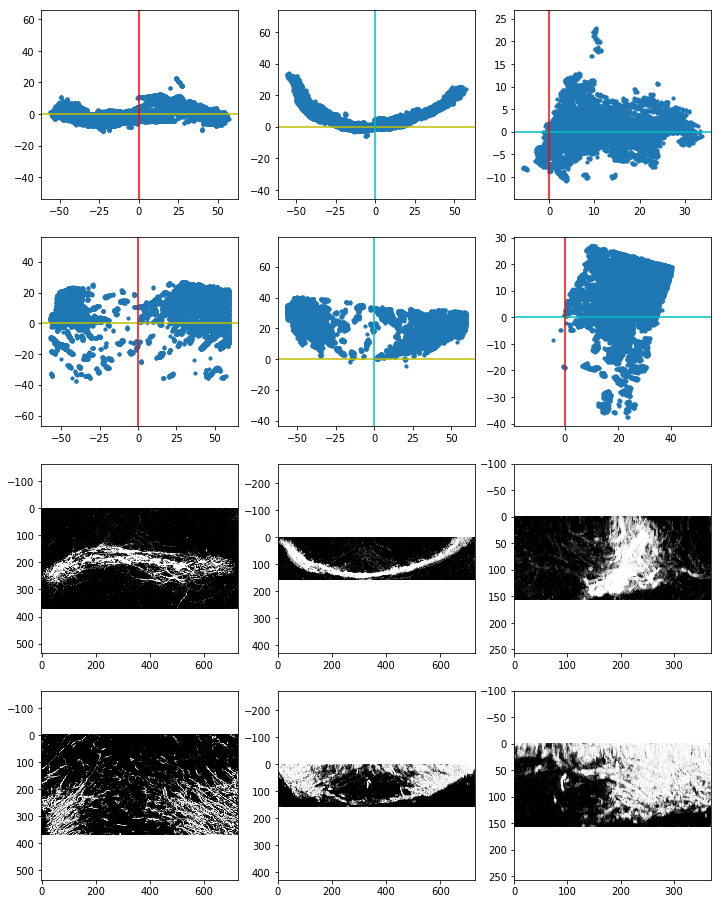

In [141]:
k,df,Ldf,ax = start('139')

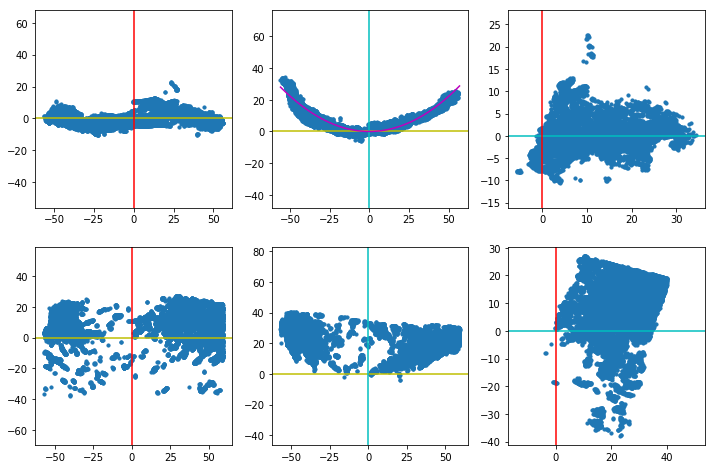

In [142]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

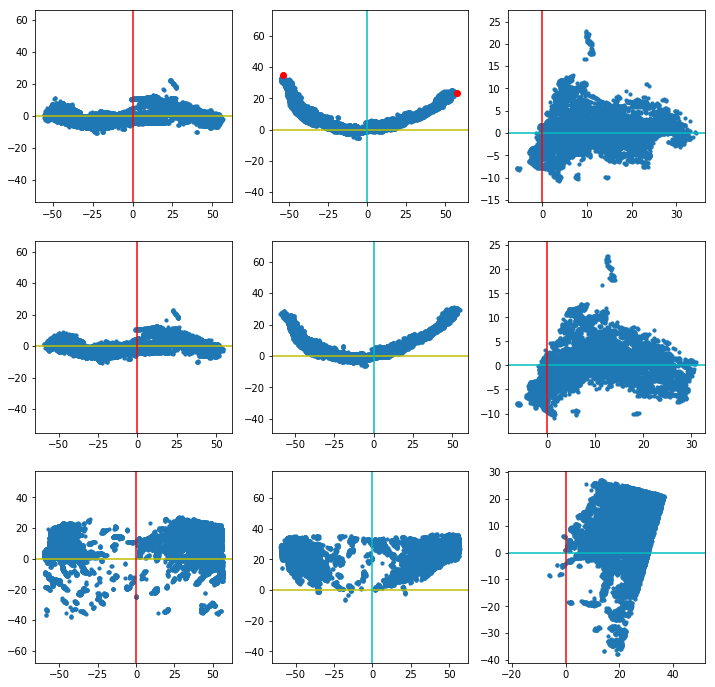

In [143]:
df1,Ldf1,pts,ax = ut.check_pts(df,Ldf,'z')

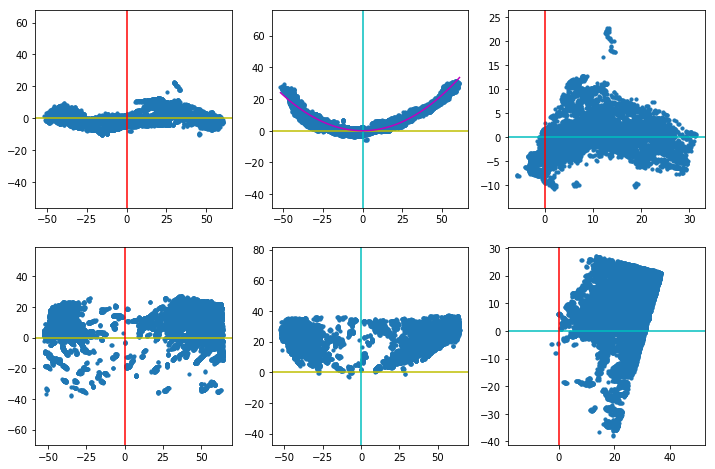

In [144]:
df2,Ldf2,mm,ax = ut.ch_vertex(df1,Ldf1)

In [145]:
model = save_model(k,mm,model)
save_both(k,df2,Ldf2[0])

Write to .\data\Output_wt03-09-21-29\AT_139_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_139_wt.psi complete


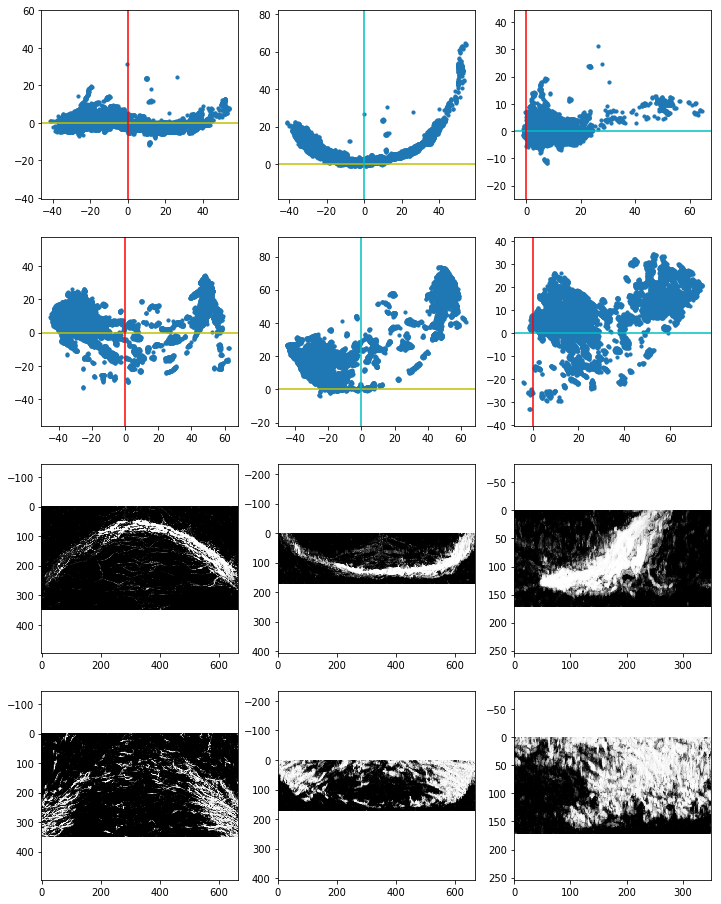

In [146]:
k,df,Ldf,ax = start('140')

sample highly disturbed in imaging structure, possibly due to tear on left of the image causing loss of data, Vertex will be highly questionable.

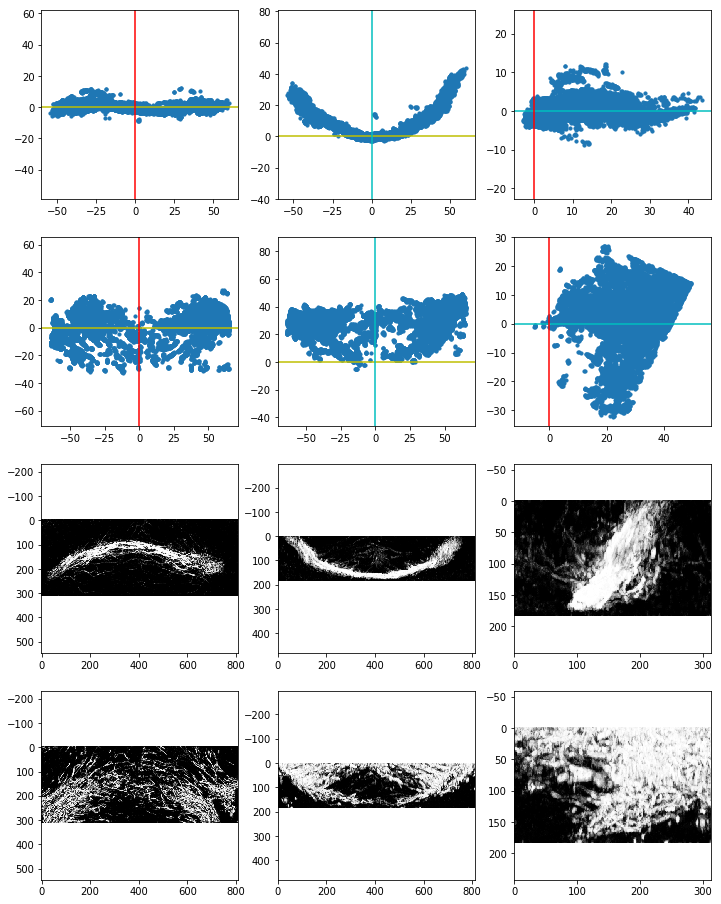

In [147]:
k,df,Ldf,ax = start('141')

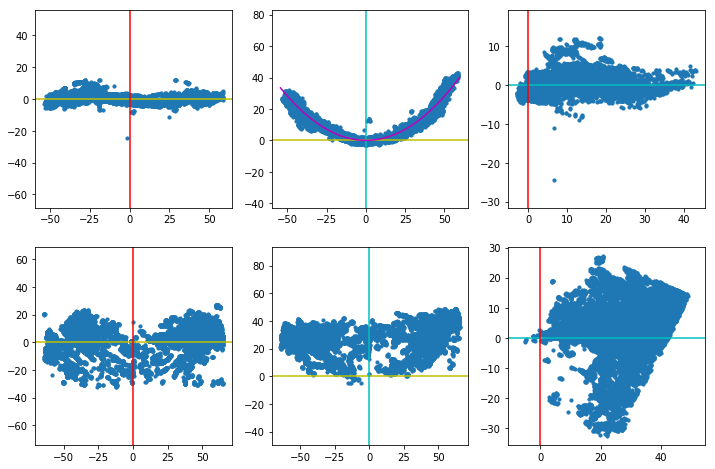

In [148]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [149]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_141_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_141_wt.psi complete


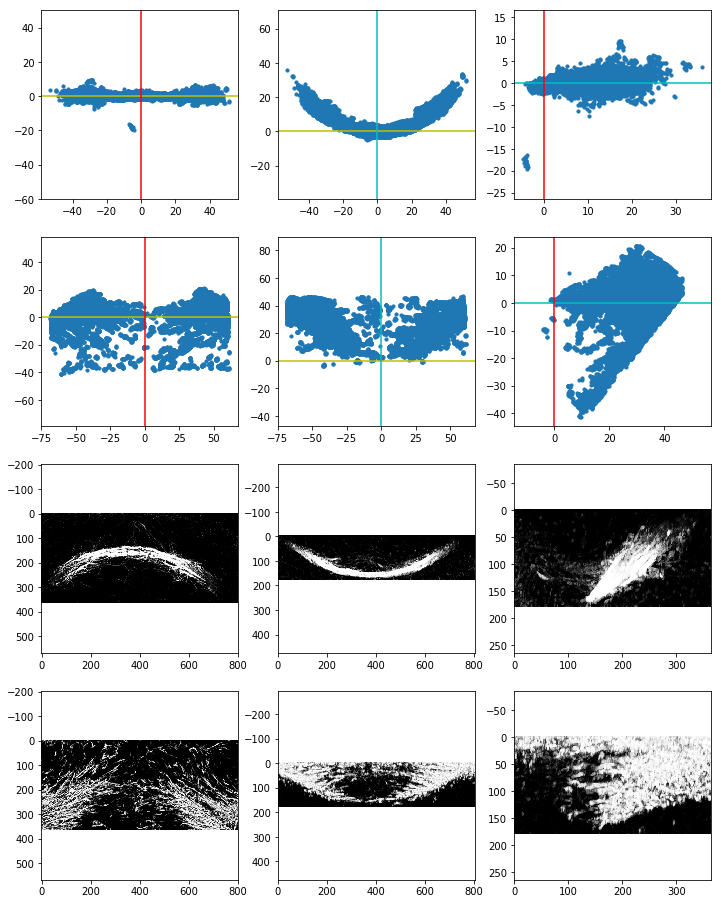

In [150]:
k,df,Ldf,ax = start('142')

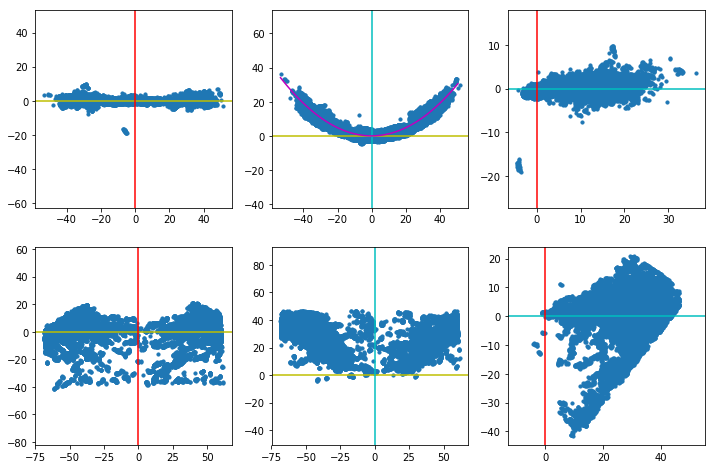

In [151]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [152]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_142_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_142_wt.psi complete


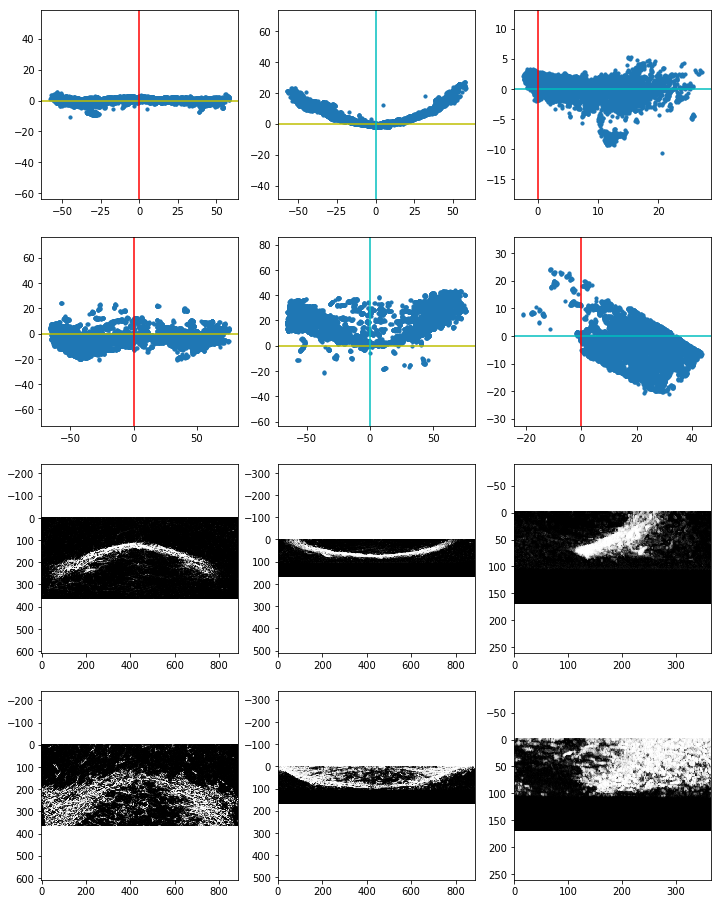

In [153]:
k,df,Ldf,ax = start('143')

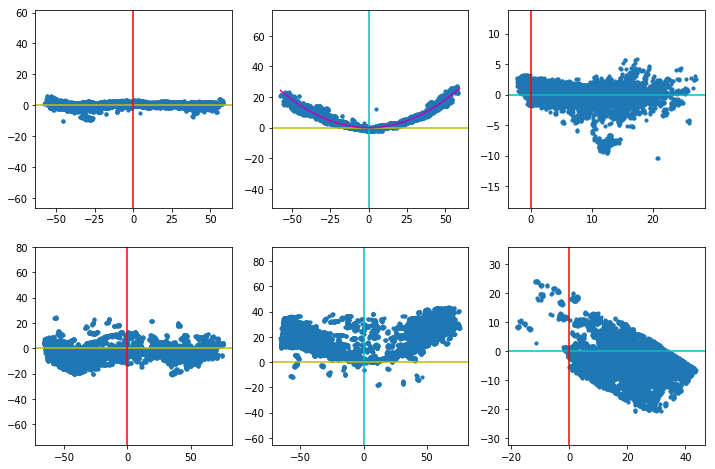

In [154]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [155]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_143_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_143_wt.psi complete


In [156]:
klist

dict_keys(['101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143'])

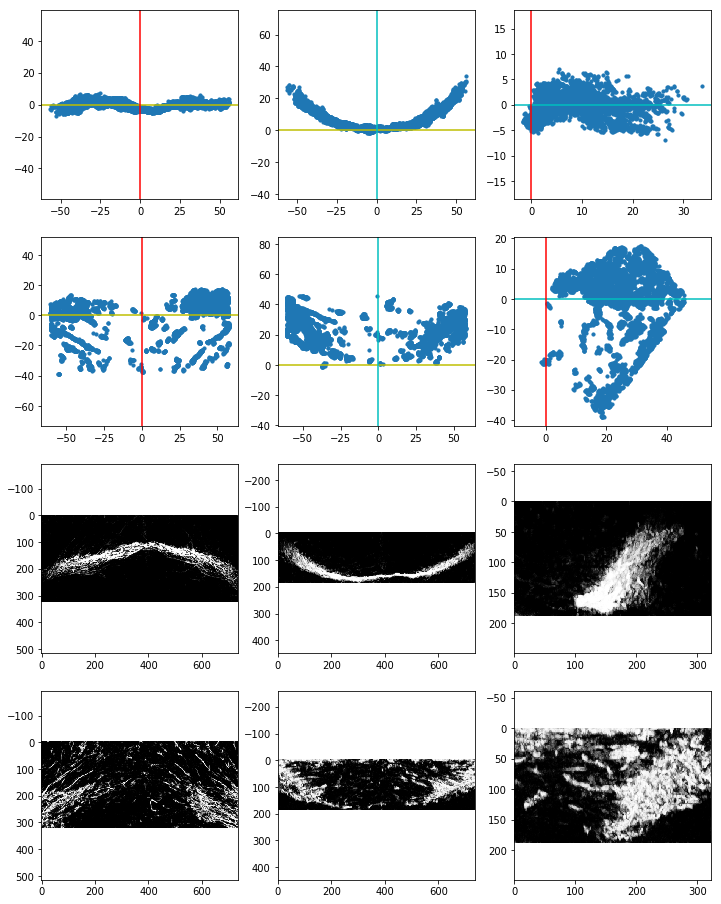

In [157]:
k,df,Ldf,ax = start('105')

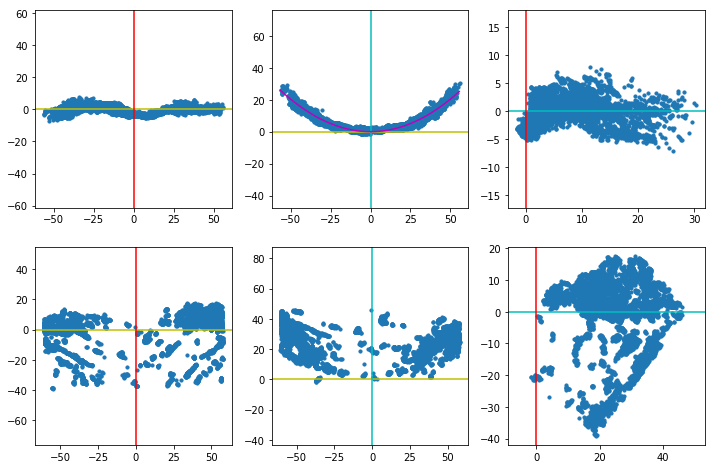

In [158]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [159]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_105_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_105_wt.psi complete


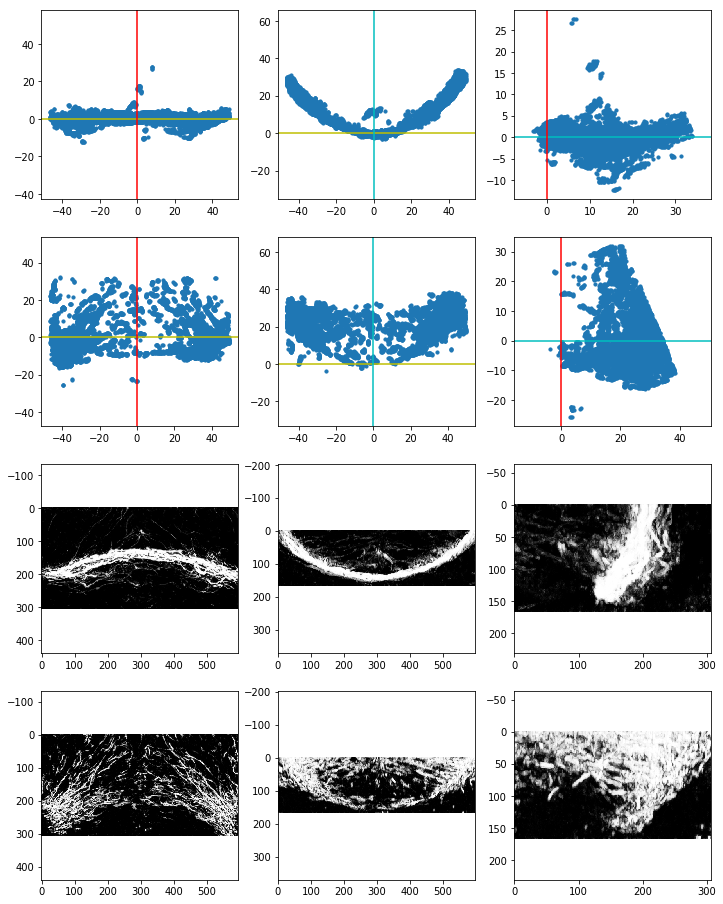

In [160]:
k,df,Ldf,ax = start('106')

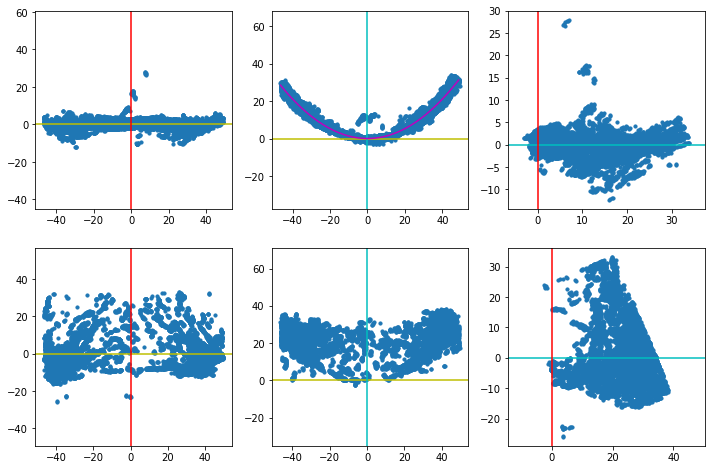

In [161]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [162]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_106_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_106_wt.psi complete


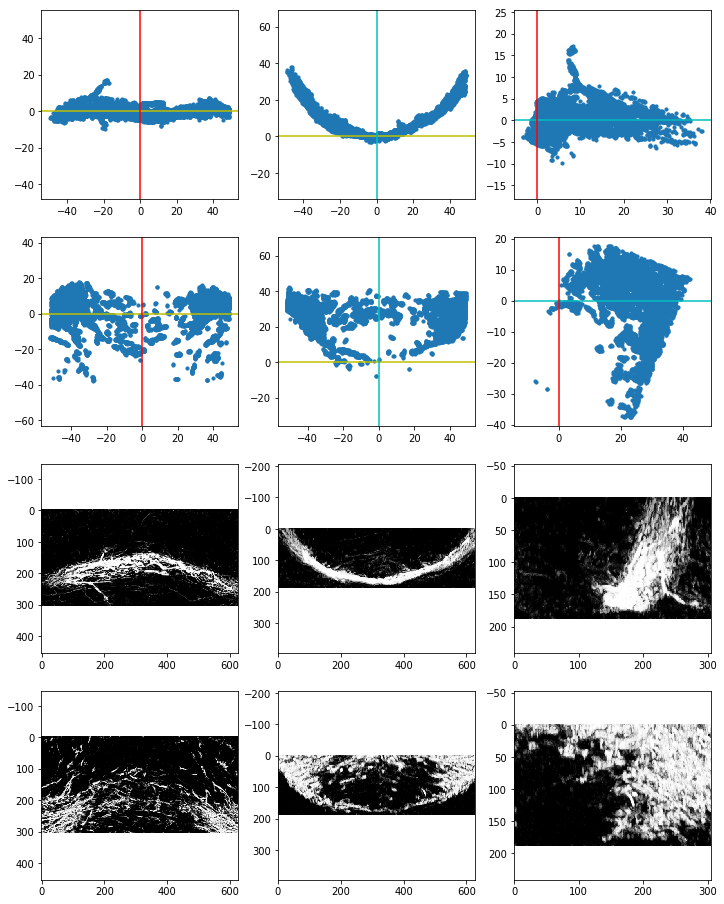

In [163]:
k,df,Ldf,ax = start('107')

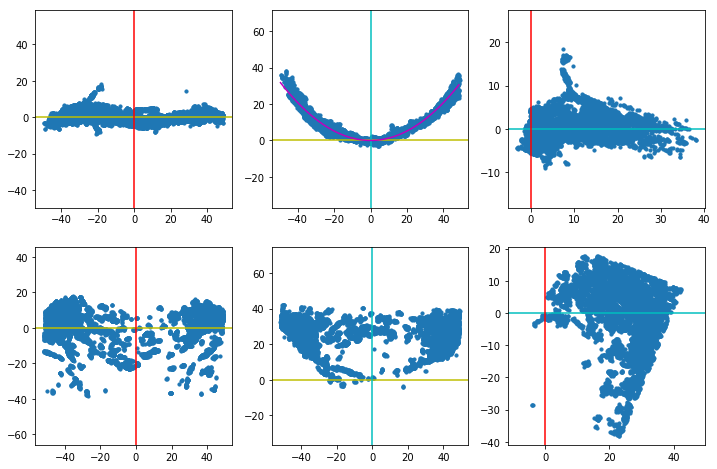

In [164]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [165]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_107_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_107_wt.psi complete


In [166]:
klist

dict_keys(['101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143'])

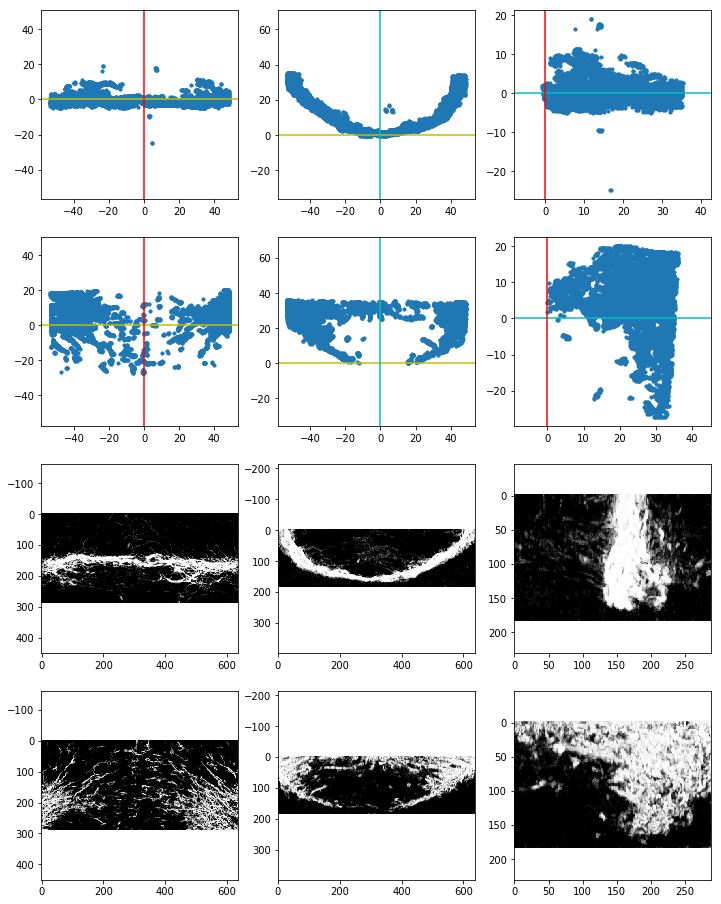

In [167]:
k,df,Ldf,ax = start('110')

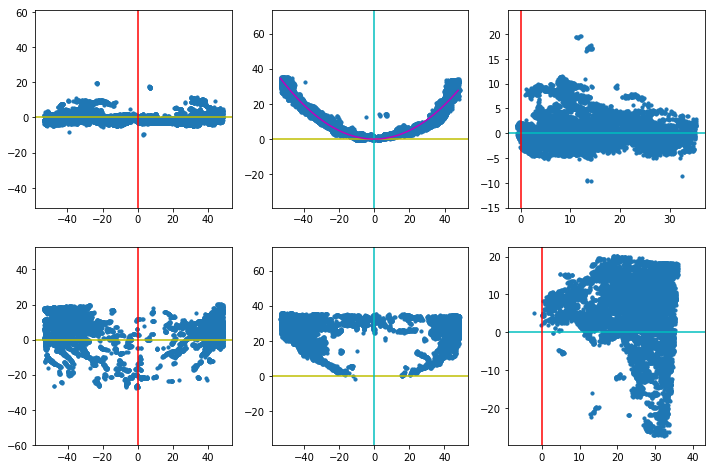

In [168]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [169]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_110_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_110_wt.psi complete


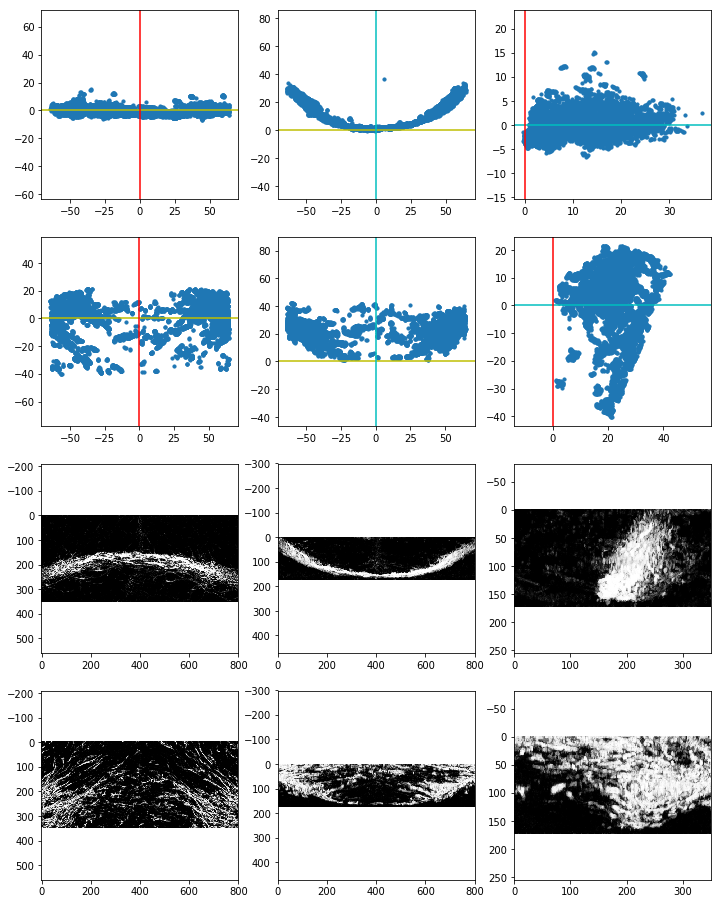

In [170]:
k,df,Ldf,ax = start('115')

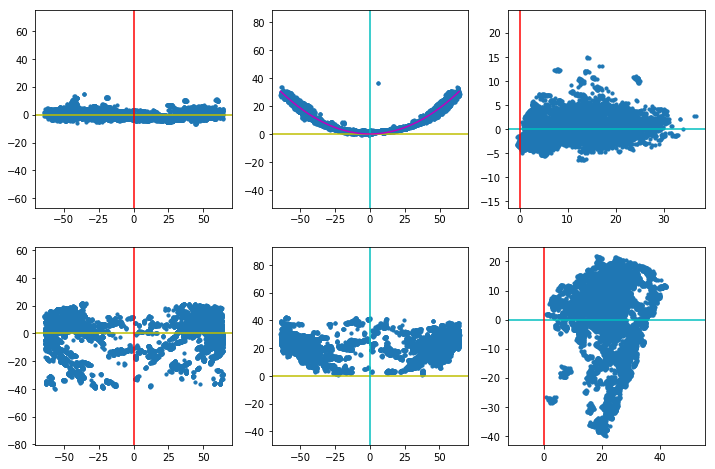

In [171]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [172]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_115_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_115_wt.psi complete


In [173]:
klist

dict_keys(['101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143'])

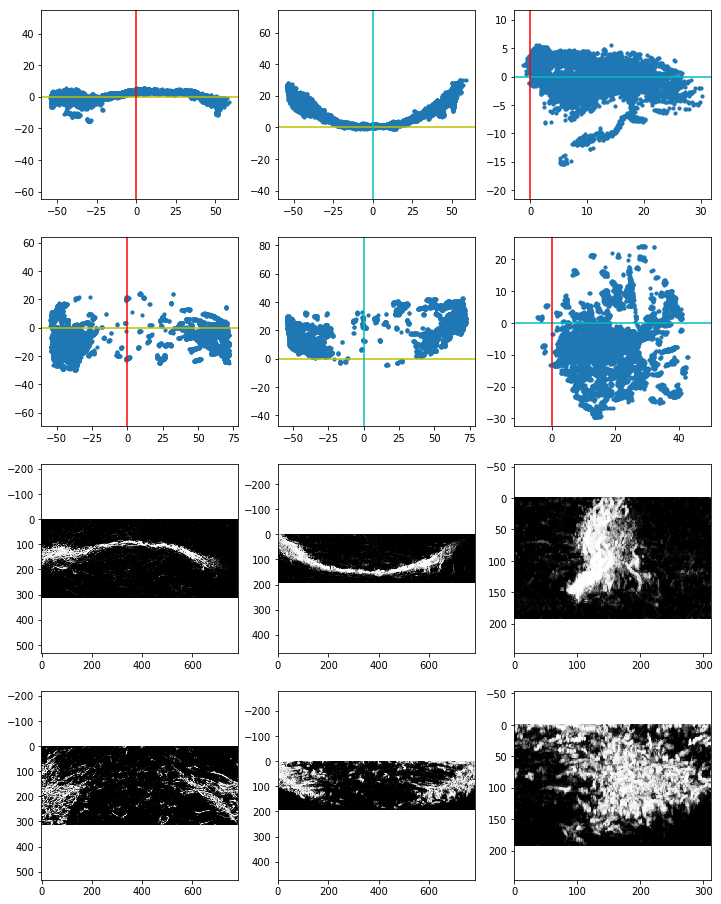

In [174]:
k,df,Ldf,ax = start('116')

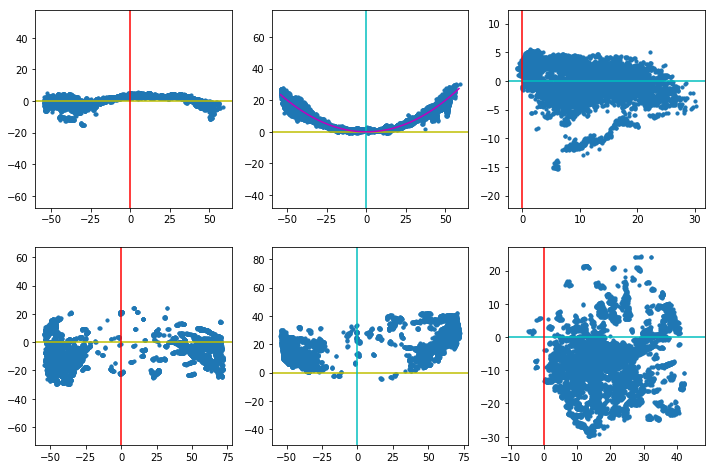

In [175]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [176]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_116_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_116_wt.psi complete


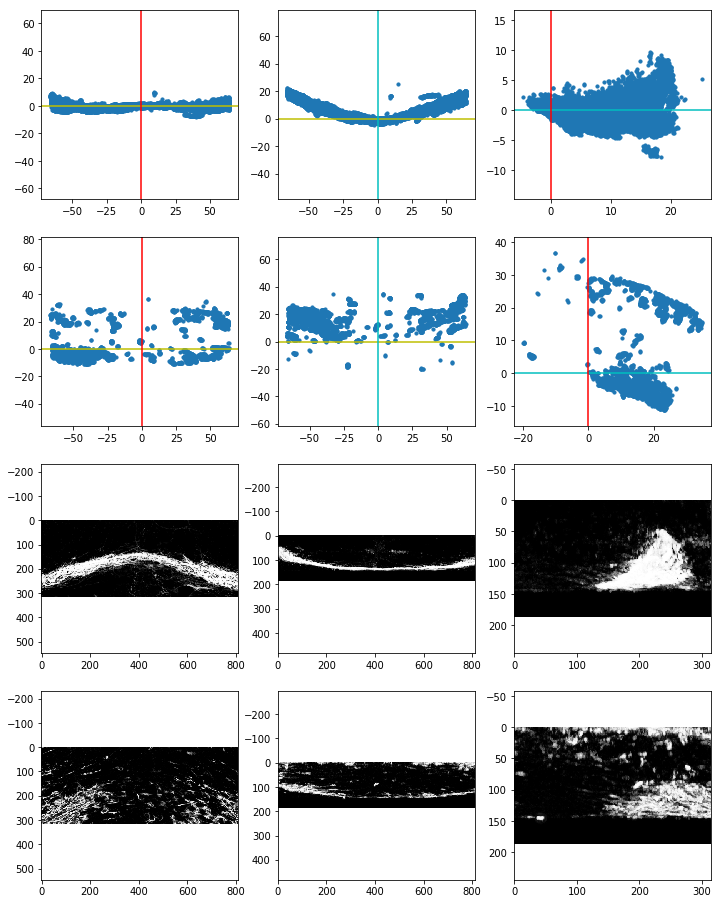

In [177]:
k,df,Ldf,ax = start('117')

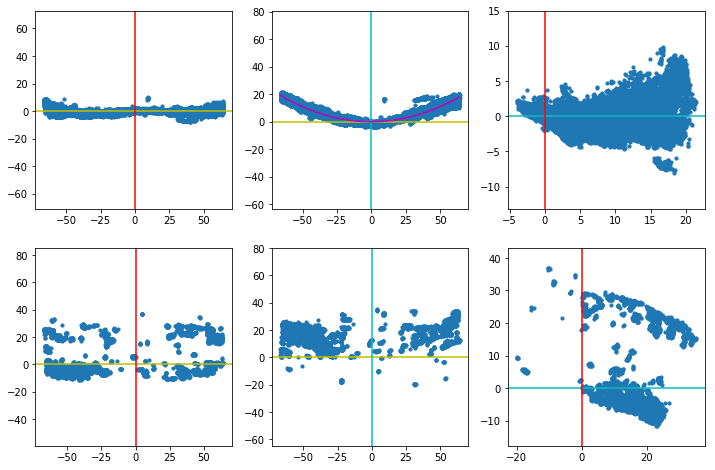

In [178]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [179]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_117_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_117_wt.psi complete


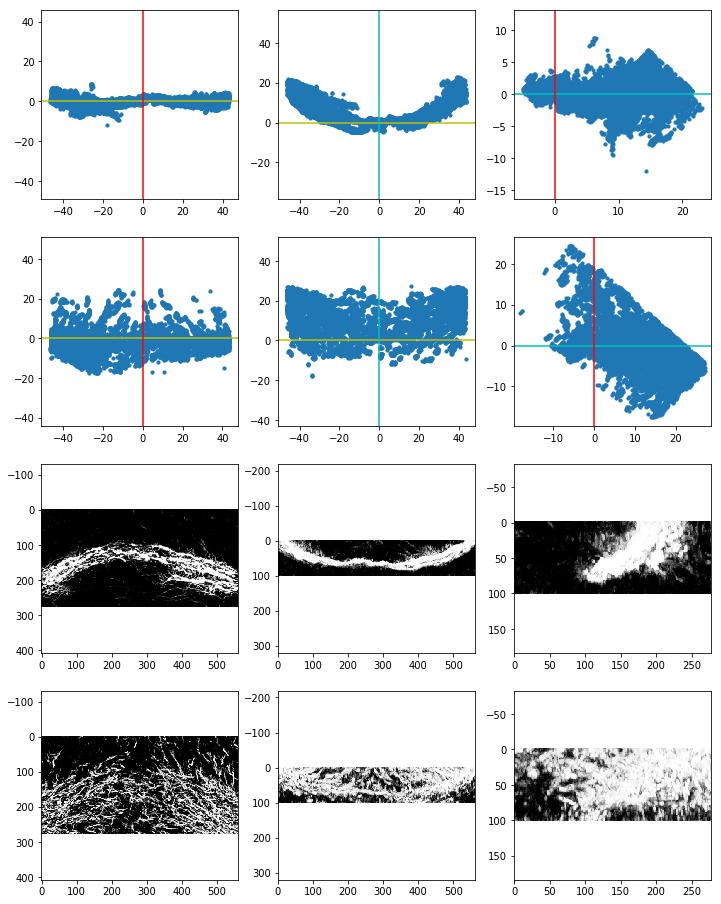

In [180]:
k,df,Ldf,ax = start('122')

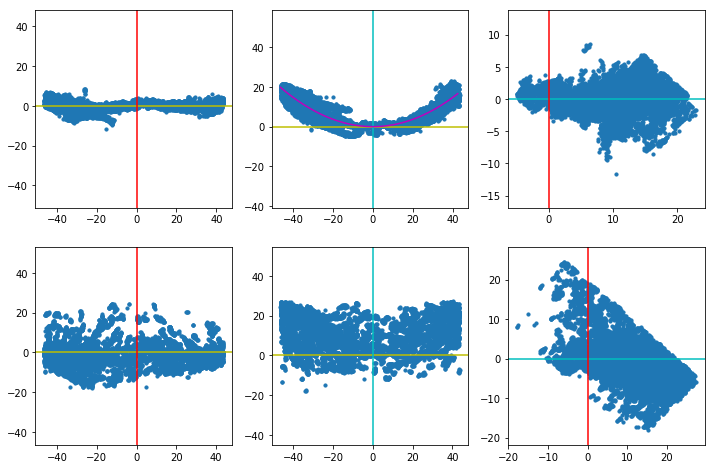

In [181]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [182]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_122_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_122_wt.psi complete


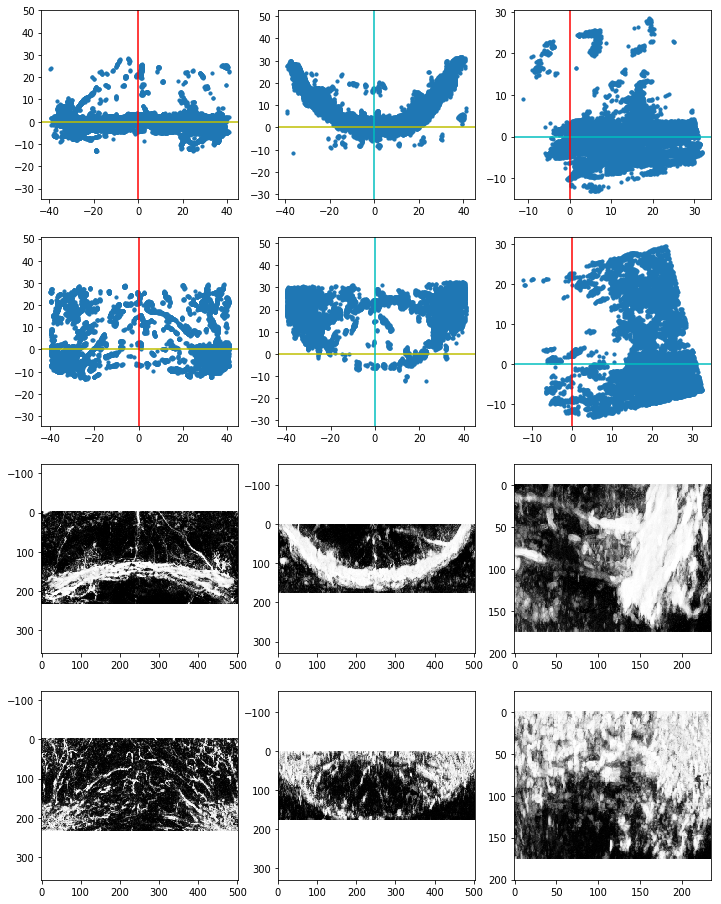

In [183]:
k,df,Ldf,ax = start('123')

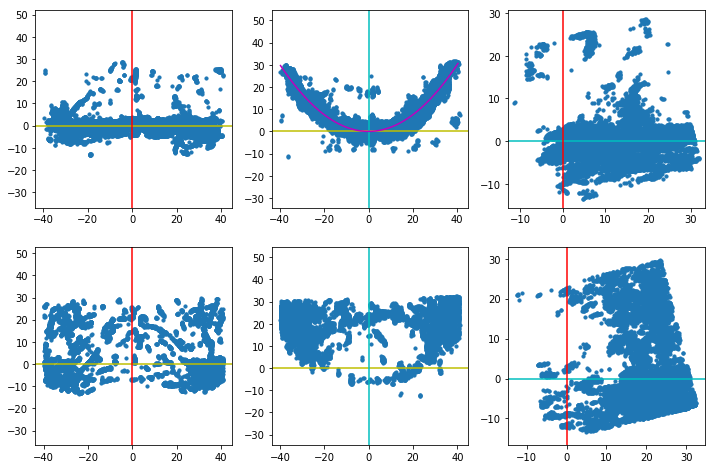

In [184]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [185]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_123_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_123_wt.psi complete


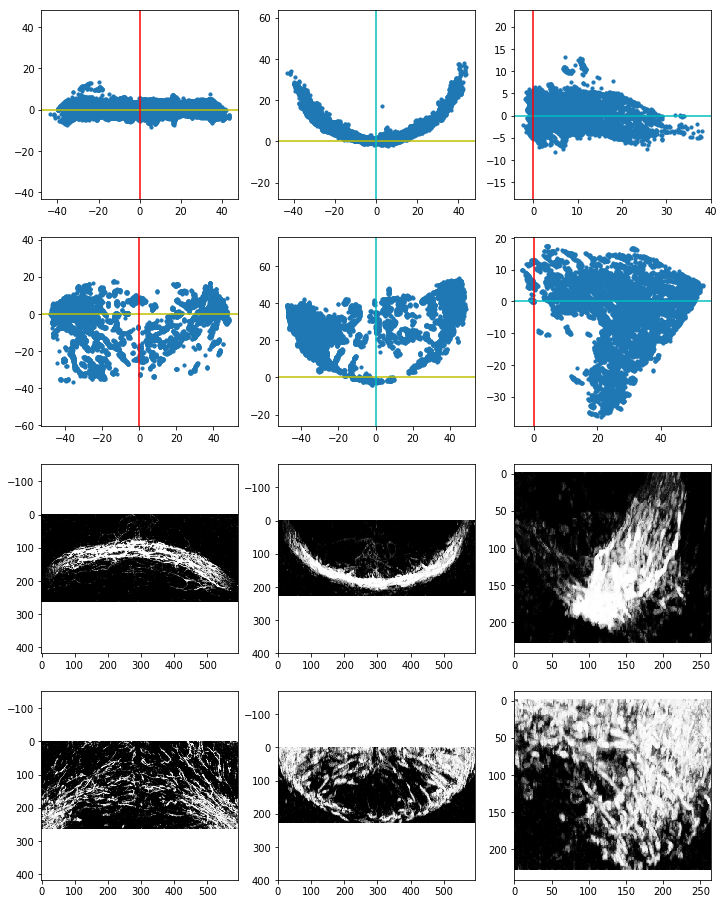

In [186]:
k,df,Ldf,ax = start('124')

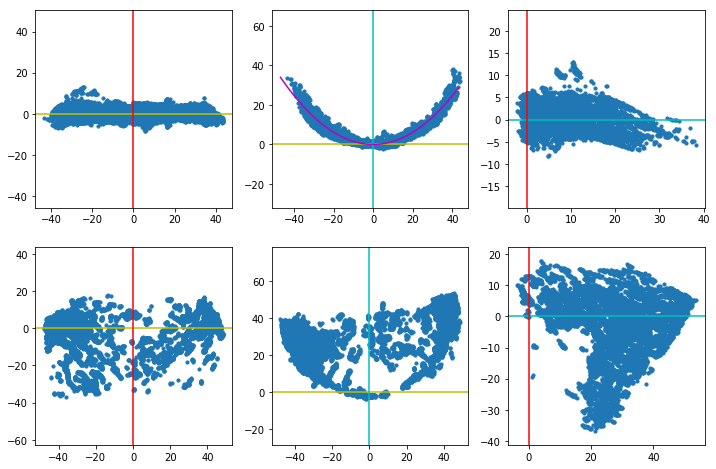

In [187]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [188]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_124_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_124_wt.psi complete


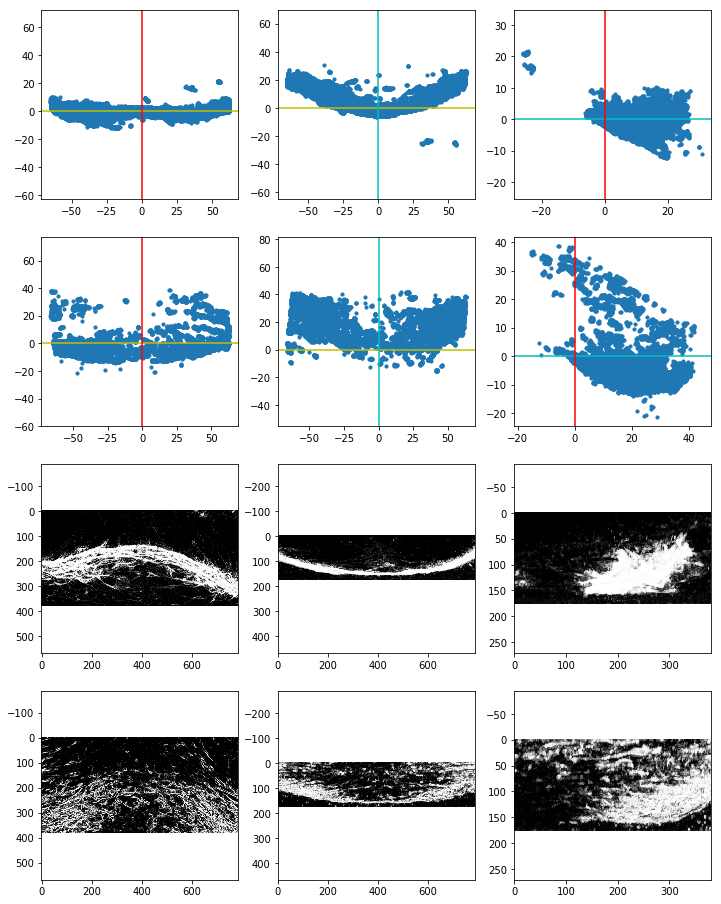

In [189]:
k,df,Ldf,ax = start('126')

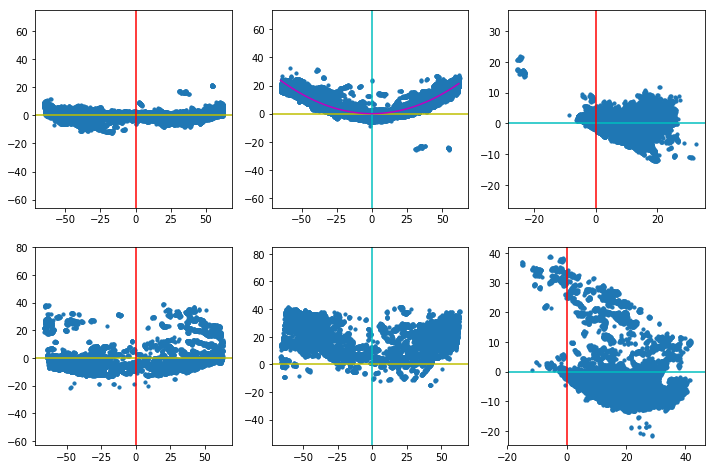

In [190]:
df1,Ldf1,mm,ax = ut.ch_vertex(df,Ldf)

In [191]:
model = save_model(k,mm,model)
save_both(k,df1,Ldf1[0])

Write to .\data\Output_wt03-09-21-29\AT_126_wt.psi complete
Write to .\data\Output_wt03-09-21-29\ZRF_126_wt.psi complete


In [193]:
model.to_csv(os.path.join(outdir,'models.csv'))